In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import editdistance
import seaborn as sns

In [ ]:
def pass_at_k(n, c, k):
    """
    :param n: total number of samples
    :param c: number of correct samples
    :param k: k in pass@$k$
    """
    if n - c < k: return 1.0
    return 1.0 - np.prod(1.0 - k /
        np.arange(n - c + 1, n + 1))

In [3]:
n = 100
c = 6
k = 1
print(1.0 - k /        np.arange(n - c + 1, n + 1))

[0.98947368 0.98958333 0.98969072 0.98979592 0.98989899 0.99      ]


In [ ]:
def E_trials(n, c):
    if c == 0: return np.inf
    # model as negative binomial
    p = c / n
    return (1-p)/p

In [ ]:
def E_trials2(n, c):
    if c == 0: return np.inf
    # model as negative binomial
    p = pass_at_k(n=n, c=c, k=1)
    return (1-p)/p

In [6]:
E_trials(100, 50)

1.0

In [ ]:
temps = [0.1, 0.3, 0.5, 0.7, 1.0]
pds = ['L', 'M', 'H']
pde = ["Low", "Medium", "High"]

In [ ]:
no_area_problems = [7,12,20]

In [ ]:
model_colors = {
    'llm': '#E69F00',
    'gpt3.5': '#56B4E9',
    'gpt4': '#0072B2',
    'llama': '#009E73',
    'claude': '#D55E00',
    'mistral': '#CC79A7',
    'gemini': '#F0E442',
}

model_linestyles = {
    'llm': 'solid',
    'gpt3.5': 'solid',
    'gpt4': 'dashed',
    'llama': 'dashdot',
    'claude': 'dashdot',
    'mistral': 'solid',
    'gemini': 'dashed',
}

model_markertypes = {
    'llm': '.',
    'gpt3.5': 'v',
    'gpt4': 'P',
    'llama': '*',
    'claude': 's',
    'mistral': 'h',
    'gemini': 'X',
}

In [ ]:
problemid_readable = {
    1: 'LFSR',
    2: 'Quark P Function',
    3: 'Quark F Function',
    4: 'Quark G Function',
    5: 'Quark H Function',
    6: 'Quark Top Module',
    7: 'Present Rotate',
    8: 'Present Round',
    9: 'Present Keyschedule',
    10: 'Present Sbox',
    11: 'Present Substitution Layer',
    12: 'Present Permutation Layer',
    13: 'Present Top Module',
    14: 'AES Round Function',
    15: 'AES Final Round',
    16: 'AES FF Multiplication 2',
    17: 'AES FF Multiplication 3',
    18: 'AES Keyschedule',
    19: 'AES Lastcolumn',
    20: 'AES Shift Row',
    21: 'AES Substitution Layer',
    22: 'AES Sbox',
    23: 'AES Mixcolumns',
    24: 'AES Top Module',
    25: 'Present Sbox (Software)',
}

problemid_challenge = {
    1: 'Basic',
    2: 'Basic',
    3: 'Medium',
    4: 'Medium',
    5: 'Medium',
    6: 'Challenging',
    7: 'Basic',
    8: 'Basic',
    9: 'Basic',
    10: 'Medium',
    11: 'Medium',
    12: 'Challenging',
    13: 'Challenging',
    14: 'Basic',
    15: 'Basic',
    16: 'Basic',
    17: 'Basic',
    18: 'Medium',
    19: 'Medium',
    20: 'Medium',
    21: 'Medium',
    22: 'Challenging',
    23: 'Challenging',
    24: 'Challenging',
    25: 'Medium',
}

In [11]:
for i, m in enumerate(['llm', 'gpt3.5', 'gpt4', 'claude', 'llama', 'mistral', 'gemini']):
    plt.plot([i] * 5, label=m, color=model_colors[m], linestyle=model_linestyles[m], marker=model_markertypes[m])

plt.legend()

Error in callback <function _draw_all_if_interactive at 0x7f4a60c081f0> (for post_execute), with arguments args (),kwargs {}:


<Figure size 640x480 with 1 Axes>

In [ ]:
SMALL_SIZE = 20
MEDIUM_SIZE = 22
BIGGER_SIZE = 24

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
plt.rc('figure', dpi=300)

# LFSR

In [ ]:
data = pd.read_csv(f"problem1/stats.csv")
data.drop_duplicates(inplace=True, ignore_index=True)
# data.to_csv("problem1/stats.csv", index=False)

In [14]:
data.head()

,filename,model_type,prompt_detail,temp,completion_id,compiled,passed_bench,period_low,entropy_low,period_high,entropy_high,area
0,ref.sv,manual,NaN,-1.0,-1,1,1,65535,11.09034,1,0.0,28.508159
1,completions_llm/completion_H_t0.1_0.v,llm,H,0.1,0,0,0,0,0.00000,0,0.0,NaN
2,completions_llm/completion_H_t0.1_1.v,llm,H,0.1,1,1,1,1,0.00000,1,0.0,31.604735
3,completions_llm/completion_H_t0.1_10.v,llm,H,0.1,10,0,0,0,0.00000,0,0.0,NaN
4,completions_llm/completion_H_t0.1_11.v,llm,H,0.1,11,0,0,0,0.00000,0,0.0,NaN


## Compilable & pass bench

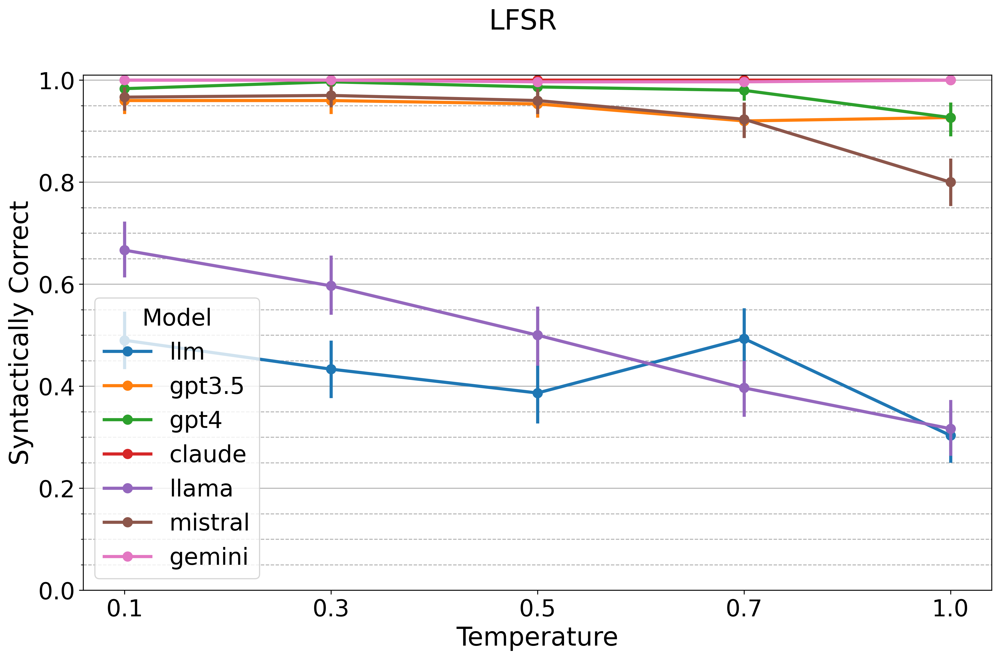

In [15]:
fig, ax = plt.subplots(figsize=(14,8))
sns.pointplot(data = data[1:], x='temp', y='passed_bench', hue='model_type', ax=ax)
ax.legend(title = "Model")
ax.grid(axis='y')
ax.grid(axis='y', which='minor', linestyle='--')
ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
ax.set_xlabel("Temperature")
ax.set_ylabel("Syntactically Correct")
ax.set_ylim([0,1.01])
fig.suptitle("LFSR")
plt.plot()
plt.savefig(f"figures/lfsr_temp_fsc.pdf", bbox_inches='tight')

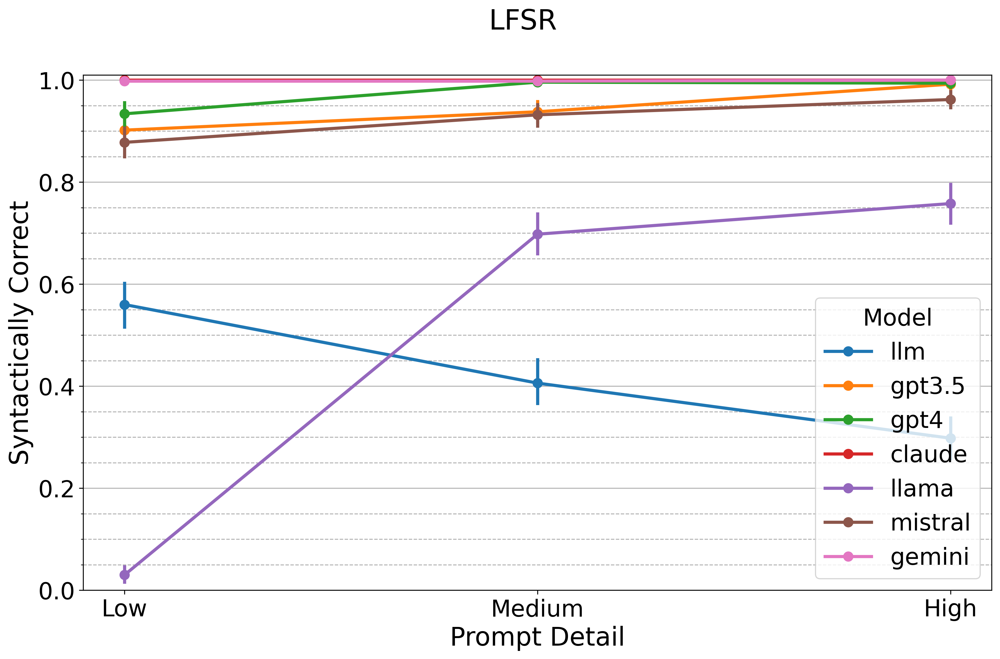

In [16]:
fig, ax = plt.subplots(figsize=(14,8))
sns.pointplot(data = data[1:], x='prompt_detail', y='passed_bench', hue='model_type', order=['L', 'M', 'H'], ax=ax)
ax.legend(title = "Model")
ax.grid(axis='y')
ax.grid(axis='y', which='minor', linestyle='--')
ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
ax.set_xlabel("Prompt Detail")
ax.set_ylabel("Syntactically Correct")
ax.set_ylim([0,1.01])
ax.set_xticklabels(['Low', 'Medium', 'High'])
fig.suptitle("LFSR")

plt.plot()
plt.savefig(f"figures/lfsr_pd_fsc.pdf", bbox_inches='tight')

## Entropy

In [17]:
ref_data = data.loc[data['filename'] == 'ref.sv']
ref_data['entropy'] = ref_data.loc[:,'entropy_low']

passing_data = data.loc[data['passed_bench'] > 0]
passing_data = passing_data.loc[data['filename'] != 'ref.sv']
passing_data['entropy'] = passing_data[['entropy_low','entropy_high']].max(axis=1)

# fix entropy values from base e to base 2
passing_data.loc[:,'entropy'] = passing_data['entropy'] * np.log2(np.e)
ref_data.loc[:,'entropy'] = ref_data['entropy'] * np.log2(np.e)

passing_data.head()

,filename,model_type,prompt_detail,temp,completion_id,compiled,passed_bench,period_low,entropy_low,period_high,entropy_high,area,entropy
2,completions_llm/completion_H_t0.1_1.v,llm,H,0.1,1,1,1,1,0.0,1,0.0,31.604735,0.0
13,completions_llm/completion_H_t0.1_2.v,llm,H,0.1,2,1,1,1,0.0,1,0.0,31.604735,0.0
16,completions_llm/completion_H_t0.1_22.v,llm,H,0.1,22,1,1,0,0.0,0,0.0,NaN,0.0
17,completions_llm/completion_H_t0.1_23.v,llm,H,0.1,23,1,1,1,0.0,1,0.0,31.604735,0.0
20,completions_llm/completion_H_t0.1_26.v,llm,H,0.1,26,1,1,1,0.0,1,0.0,0.000000,0.0


In [18]:
ref_data

,filename,model_type,prompt_detail,temp,completion_id,compiled,passed_bench,period_low,entropy_low,period_high,entropy_high,area,entropy
0,ref.sv,manual,NaN,-1.0,-1,1,1,65535,11.09034,1,0.0,28.508159,15.999978


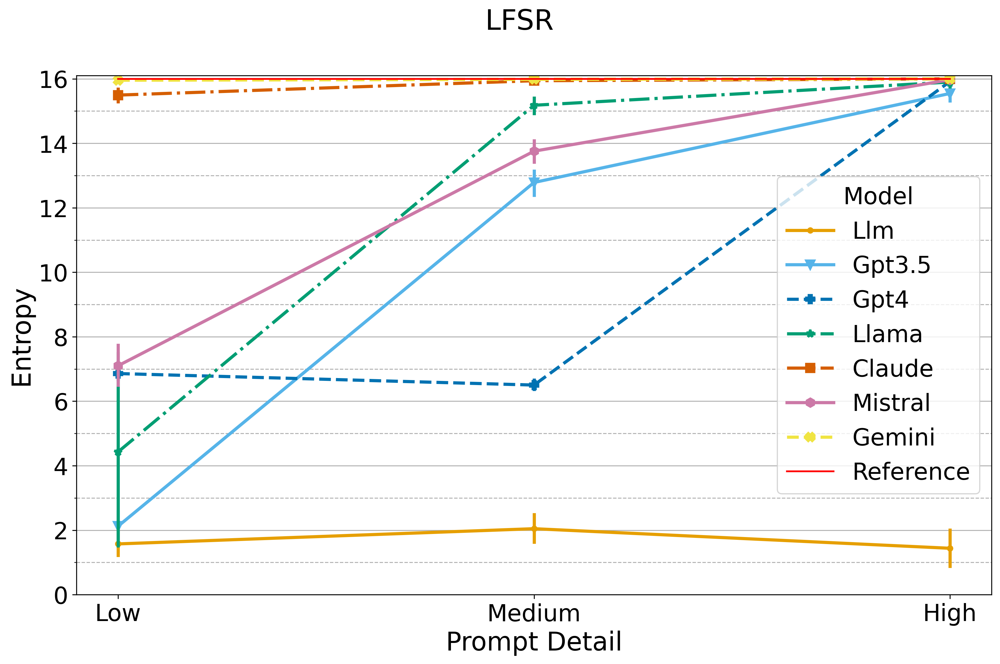

In [19]:
fig, ax = plt.subplots(figsize=(14,8))
sns.pointplot(data = passing_data, x='prompt_detail', y='entropy', hue='model_type', order=['L', 'M', 'H'], 
              hue_order=list(model_markertypes.keys()), 
              ax=ax, 
              palette=model_colors, 
              markers=list(model_markertypes.values()),
              linestyles=list(model_linestyles.values()),
             )
ax.plot([ref_data['entropy']]*3, label = 'Reference', c = 'red')
legend = ax.legend(title = "Model")

# Capitalize the legend labels
for text in legend.get_texts():
    text.set_text(text.get_text().capitalize())

ax.grid(axis='y')
ax.grid(axis='y', which='minor', linestyle='--')
ax.set_yticks(np.arange(0, 16.1, 2), minor=False)
ax.set_yticks(np.arange(0, 16.1, 1), minor=True)
ax.set_xlabel("Prompt Detail")
ax.set_ylabel("Entropy")
ax.set_ylim([0,16.1])
ax.set_xticklabels(['Low', 'Medium', 'High'])
fig.suptitle("LFSR")

plt.plot()
plt.savefig(f"figures/lfsr_pd_entropy.pdf", bbox_inches='tight')

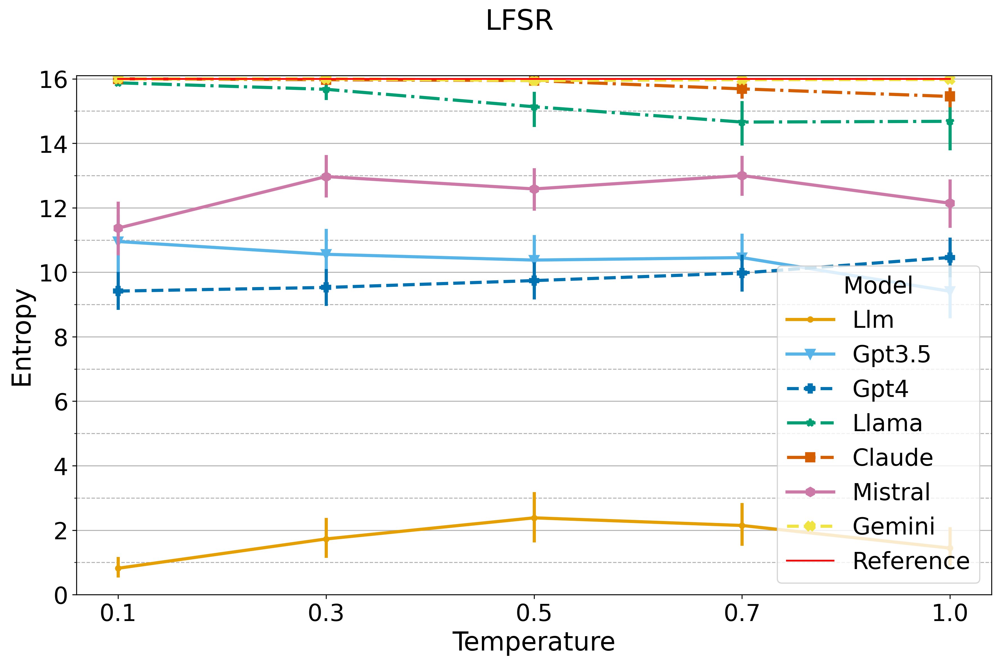

In [153]:
fig, ax = plt.subplots(figsize=(14,8))
sns.pointplot(data = passing_data, x='temp', y='entropy', hue='model_type', ax=ax, 
              hue_order=list(model_markertypes.keys()), 
              palette=model_colors,
              markers=list(model_markertypes.values()),
              linestyles=list(model_linestyles.values()),
             )
ax.plot([ref_data['entropy']]*5, label = 'Reference', c = 'red')
legend = ax.legend(title = "Model", loc='lower right')
# Capitalize the legend labels
for text in legend.get_texts():
    text.set_text(text.get_text().capitalize())

ax.grid(axis='y')
ax.grid(axis='y', which='minor', linestyle='--')
ax.set_yticks(np.arange(0, 16.1, 2), minor=False)
ax.set_yticks(np.arange(0, 16.1, 1), minor=True)
ax.set_xlabel("Temperature")
ax.set_ylabel("Entropy")
ax.set_ylim([0,16.1])
fig.suptitle("LFSR")

plt.plot()
plt.savefig(f"figures/lfsr_temp_entropy.pdf", bbox_inches='tight')

## Pass@k

In [ ]:
data['entropy'] = data[['entropy_low','entropy_high']].max(axis=1)
data['period'] = data[['period_low', 'period_high']].max(axis=1)

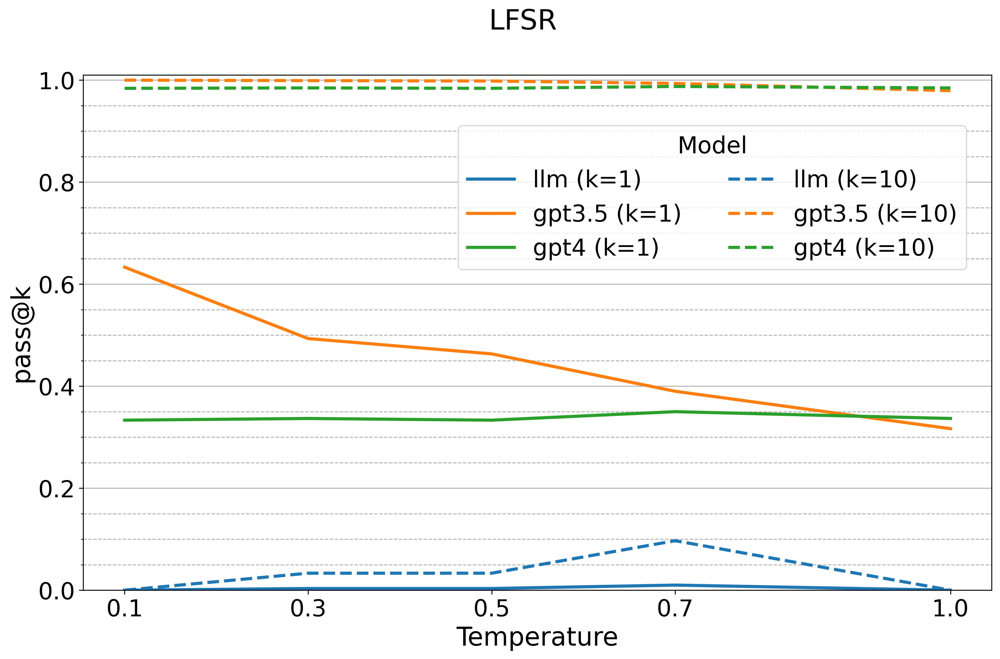

In [21]:
fig, ax = plt.subplots(figsize=(14,8))
for k in [1, 10]:
    for m in ['llm', 'gpt3.5', 'gpt4']:
        mtrack = []
        for t in temps:
            tmp = data.loc[(data['temp'] == t) & (data['model_type'] == m)]['period']
            pak = pass_at_k(n=len(tmp), c=(tmp == 65535).sum(), k=k)
            mtrack.append(pak)
        ax.plot(temps, mtrack, label=m + f" (k={k})", linewidth=2.7, c=model_colors[m], linestyle='--' if k == 10 else '-')
    
    ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
    ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
    ax.grid(axis='y', which='major', linestyle='-')
    ax.grid(axis='y', which='minor', linestyle='--')
    ax.set_xticks(temps)
    ax.set_xlabel("Temperature")
    ax.set_ylabel(f"pass@k")
    ax.set_ylim([0,1.01])
    fig.suptitle("LFSR")
ax.legend(title = "Model", ncol=2, bbox_to_anchor=(0.4, 0.6, 0.7, 0.5))
# ax.set_xticklabels(['Low', 'Medium', 'High'])
plt.plot()
plt.savefig(f"figures/lfsr_temp_pass@k.pdf", bbox_inches='tight')

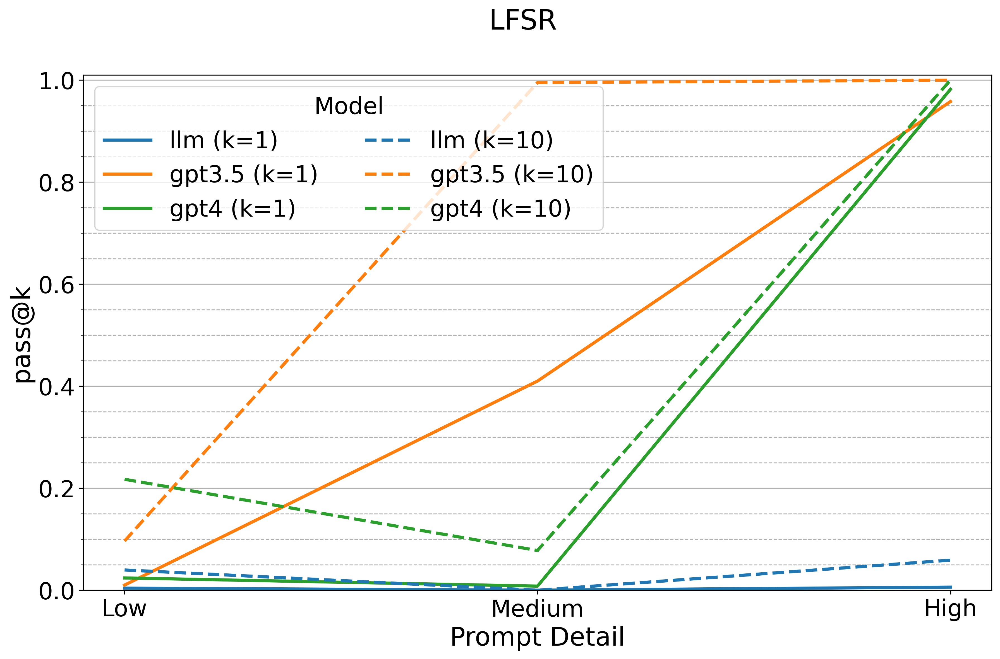

In [17]:

fig, ax = plt.subplots(figsize=(14,8))
for k in [1, 10]:
    for m in ['llm', 'gpt3.5', 'gpt4']:
        mtrack = []
        for pd_ in pds:
            tmp = data.loc[(data['prompt_detail'] == pd_) & (data['model_type'] == m)]['period']
            pak = pass_at_k(n=len(tmp), c=(tmp == 65535).sum(), k=k)
            mtrack.append(pak)
        ax.plot(pde, mtrack, label=m + f" (k={k})", linewidth=2.7, c=model_colors[m], linestyle='--' if k == 10 else '-')
    
    ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
    ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
    ax.grid(axis='y', which='major', linestyle='-')
    ax.grid(axis='y', which='minor', linestyle='--')
    ax.set_xlabel("Prompt Detail")
    ax.set_ylabel(f"pass@k")
    ax.set_ylim([0,1.01])
    fig.suptitle("LFSR")
ax.legend(title = "Model", ncol=2)
# ax.set_xticklabels(['Low', 'Medium', 'High'])
plt.plot()
plt.savefig(f"figures/lfsr_pd_pass@k.pdf", bbox_inches='tight')

# QUARK

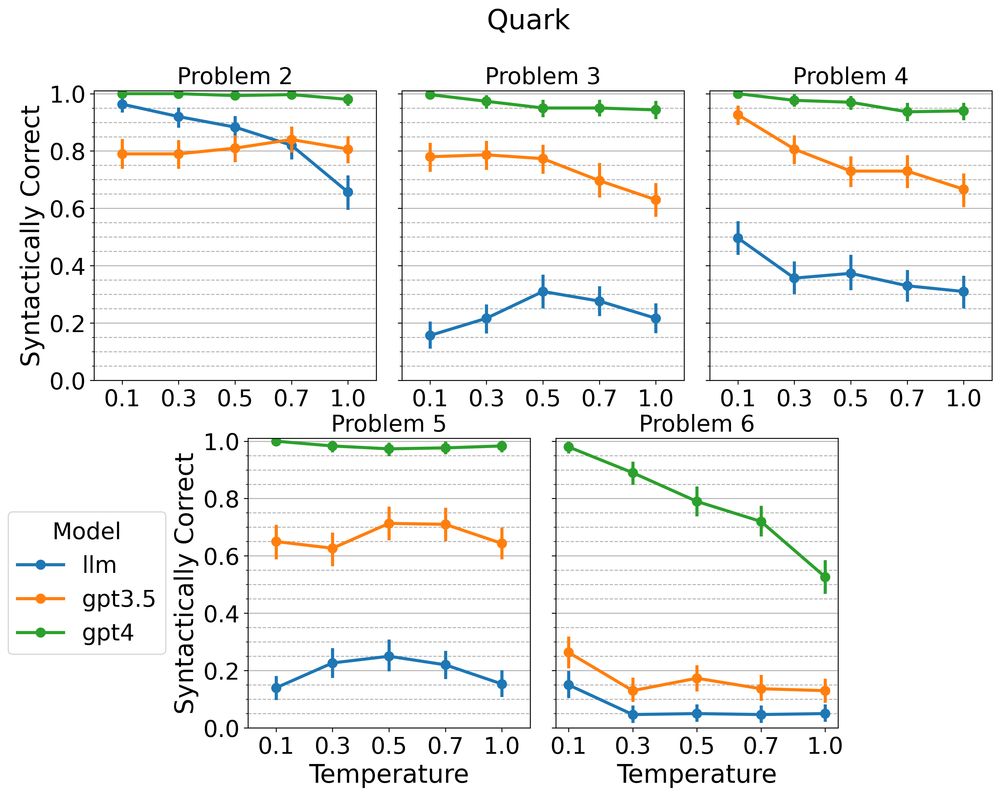

In [18]:
quark_probs = [
    ((0,0),2), 
    ((0,2),3), 
    ((0,4),4),
    ((1,1),5), 
    ((1,3),6)
]

fig = plt.figure(figsize=(14, 10))
fig.suptitle("Quark")

for i, problem_id in quark_probs:
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    ax = plt.subplot2grid(shape=(2,6), loc=i, colspan=2, sharey=prev_ax if problem_id in [3, 4, 6] else None)
    sns.pointplot(data = data[1:], x='temp', y='passed_bench', hue='model_type', ax=ax)
    ax.set_ylim([0, 1.01])
    ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
    ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
    ax.set_xlabel("Temperature")
    if problem_id in [3, 4, 6]:
        for l in ax.get_yticklabels():
            l.set_visible(False) 
        ax.set_ylabel("")
    else:
        ax.set_ylabel("Syntactically Correct")
    # ax.legend(title = "Model")
    ax.legend().set_visible(False)
    ax.grid(axis='y')
    ax.grid(axis='y', which='minor', linestyle='--')
    ax.set_title(f"Problem {problem_id}")
    prev_ax = ax
    if problem_id == 5:
        ax.legend(title= "Model", loc = "center right", bbox_to_anchor=(-0.25, 0.5))
    if problem_id in [5, 6]:
        ax.set_xlabel("Temperature")
    else:
        ax.set_xlabel("")
plt.plot()
plt.savefig(f"figures/quark_temp_fsc.pdf", bbox_inches='tight')

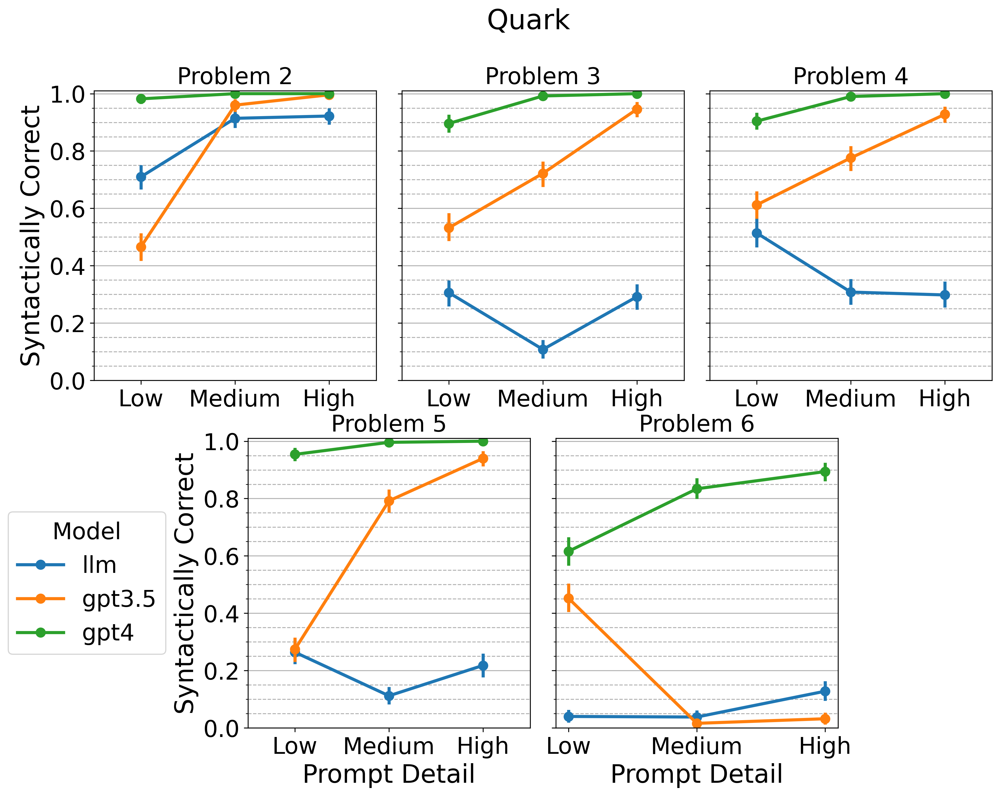

In [19]:
quark_probs = [
    ((0,0),2), 
    ((0,2),3), 
    ((0,4),4),
    ((1,1),5), 
    ((1,3),6)
]

fig = plt.figure(figsize=(14, 10))
fig.suptitle("Quark")

for i, problem_id in quark_probs:
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    ax = plt.subplot2grid(shape=(2,6), loc=i, colspan=2, sharey=prev_ax if problem_id in [3, 4, 6] else None)
    sns.pointplot(data = data[1:], x='prompt_detail', y='passed_bench', hue='model_type', order=['L', 'M', 'H'], ax=ax)
    ax.set_ylim([0, 1.01])
    ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
    ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
    ax.set_xticklabels(['Low', 'Medium', 'High'])
    ax.set_xlabel("Prompt Detail")
    if problem_id in [3, 4, 6]:
        for l in ax.get_yticklabels():
            l.set_visible(False) 
        ax.set_ylabel("")
    else:
        ax.set_ylabel("Syntactically Correct")
    # ax.legend(title = "Model")
    ax.legend().set_visible(False)
    ax.grid(axis='y')
    ax.grid(axis='y', which='minor', linestyle='--')
    ax.set_title(f"Problem {problem_id}")
    prev_ax = ax
    if problem_id == 5:
        ax.legend(title= "Model", loc = "center right", bbox_to_anchor=(-0.25, 0.5))
    if problem_id in [5, 6]:
        ax.set_xlabel("Prompt Detail")
    else:
        ax.set_xlabel("")
plt.plot()
plt.savefig(f"figures/quark_pd_fsc.pdf", bbox_inches='tight')

## Pass@k

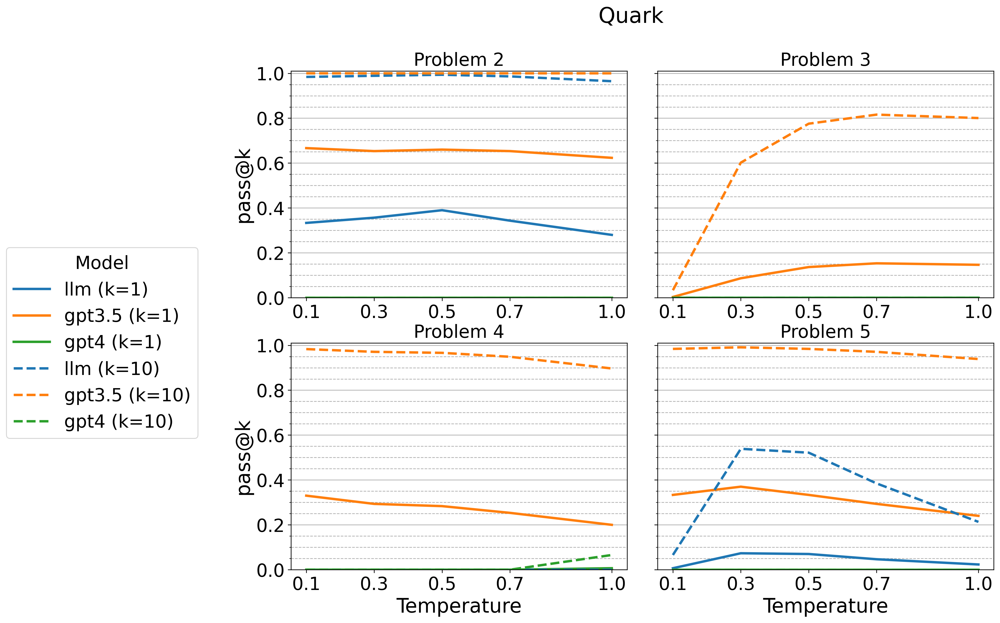

In [90]:
quark_probs = [
    ((0,0),2), 
    ((0,2),3), 
    ((1,0),4),
    ((1,2),5), 
    # ((1,3),6)
]

fig = plt.figure(figsize=(14, 10))
fig.suptitle("Quark")

for i, problem_id in quark_probs:
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    data = data.loc[data['model_type'] != 'manual']
    ax = plt.subplot2grid(shape=(2,4), loc=i, colspan=2, sharey=prev_ax if problem_id in [3, 4, 6] else None)
    if 'correct' not in data.columns:
        data['correct'] = (data['Levenshtein distance'] == 0).astype(int)
    for k in [1, 10]:
        # construct pass@k plot
        for m in ['llm', 'gpt3.5', 'gpt4']:
            mtrack = []
            for t in temps:
                tmp = data.loc[(data['temp'] == t) & (data['model_type'] == m)]['correct']
                pak = pass_at_k(n=len(tmp), c=tmp.sum(), k=k)
                mtrack.append(pak)
            ax.plot(temps, mtrack, label=m+f" (k={k})", linewidth=2.7, c=model_colors[m], linestyle='--' if k==10 else '-')
        ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
        ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
        ax.set_xticks(temps)
        ax.set_xlabel("Temperature")
        ax.set_ylabel(f"pass@k")
        ax.set_ylim([0,1.01])
        if problem_id in [3, 5]:
            for l in ax.get_yticklabels():
                l.set_visible(False) 
            ax.set_ylabel("")
        ax.legend().set_visible(False)
        ax.grid(axis='y', which='major', linestyle='-')
        ax.grid(axis='y', which='minor', linestyle='--')
        ax.set_title(f"Problem {problem_id}")
        prev_ax = ax
        if problem_id == 4:
            ax.legend(title= "Model", loc = "center right", bbox_to_anchor=(-0.25, 1.0))
        if problem_id in [4, 5, 6]:
            ax.set_xlabel("Temperature")
        else:
            ax.set_xlabel("")
plt.plot()
plt.savefig(f"figures/quark_temp_pass@k.pdf", bbox_inches='tight')

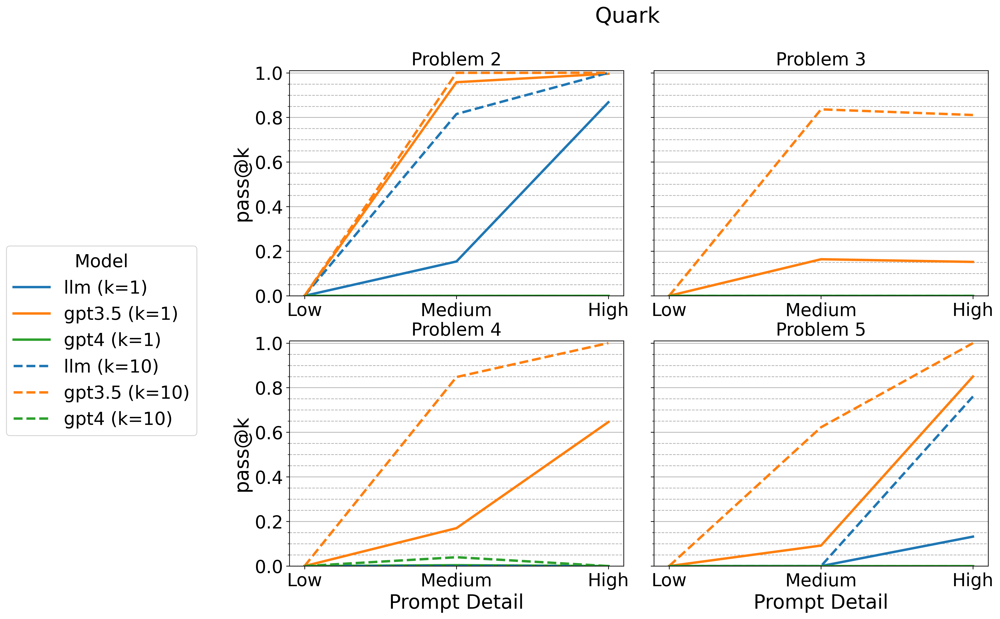

In [92]:
fig = plt.figure(figsize=(14, 10))
fig.suptitle("Quark")

for i, problem_id in quark_probs:
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    data = data.loc[data['model_type'] != 'manual']
    ax = plt.subplot2grid(shape=(2,4), loc=i, colspan=2, sharey=prev_ax if problem_id in [3, 4, 6] else None)
    if 'correct' not in data.columns:
        data['correct'] = (data['Levenshtein distance'] == 0).astype(int)
    for k in [1, 10]:
        for m in ['llm', 'gpt3.5', 'gpt4']:
            mtrack = []
            for pd_ in pds:
                tmp = data.loc[(data['prompt_detail'] == pd_) & (data['model_type'] == m)]['correct']
                pak = pass_at_k(n=len(tmp), c=tmp.sum(), k=k)
                mtrack.append(pak)
            ax.plot(pde, mtrack, label=m+f" (k={k})", linewidth=2.7, c=model_colors[m], linestyle='--' if k==10 else '-')
        ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
        ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
        ax.set_xlabel("Prompt Detail")
        ax.set_ylabel(f"pass@k")
        ax.set_ylim([0,1.01])
        if problem_id in [3, 5, 6]:
            for l in ax.get_yticklabels():
                l.set_visible(False) 
            ax.set_ylabel("")
        ax.legend().set_visible(False)
        ax.grid(axis='y', which='major', linestyle='-')
        ax.grid(axis='y', which='minor', linestyle='--')
        ax.set_title(f"Problem {problem_id}")
        prev_ax = ax
        if problem_id == 4:
            ax.legend(title= "Model", loc = "center right", bbox_to_anchor=(-0.25, 1))
        if problem_id in [4, 5, 6]:
            ax.set_xlabel("Prompt Detail")
        else:
            ax.set_xlabel("")
plt.plot()
plt.savefig(f"figures/quark_pd_pass@k.pdf", bbox_inches='tight')

# PRESENT

In [ ]:
present_probs = [
    ((0,0),7), 
    # ((0,2),8), 
    ((0,2),9),
    ((0,4),10), 
    ((1,1),11),
    ((1,3),12),
    # ((1,5),13)
]

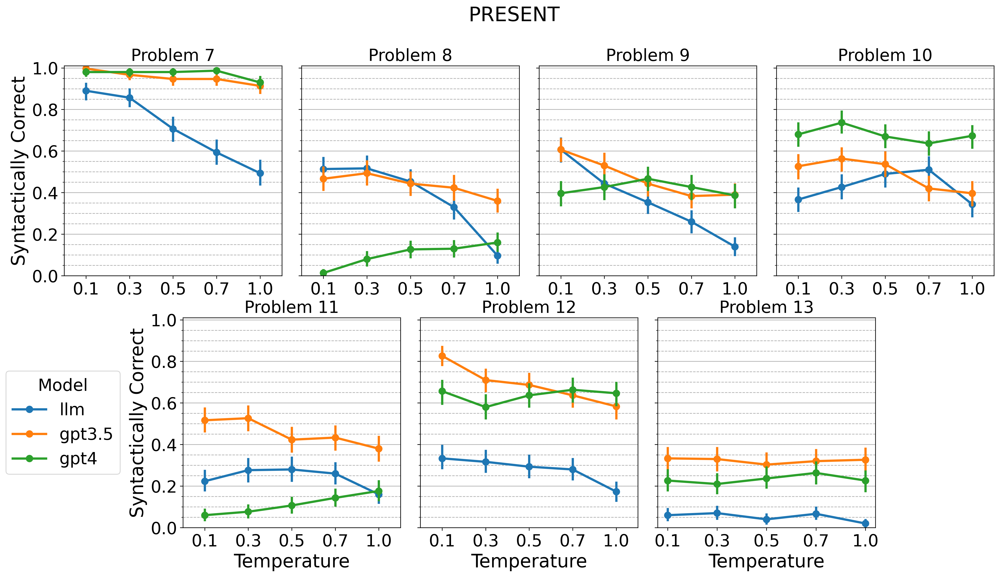

In [23]:
fig = plt.figure(figsize=(20, 10))
fig.suptitle("PRESENT")

for i, problem_id in present_probs:
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    ax = plt.subplot2grid(shape=(2,8), loc=i, colspan=2, sharey=prev_ax if problem_id in [8, 9, 10, 12, 13] else None)
    sns.pointplot(data = data[1:], x='temp', y='passed_bench', hue='model_type', ax=ax)
    ax.set_ylim([0, 1.01])
    ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
    ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
    ax.set_xlabel("Temperature")
    if problem_id in [8, 9, 10, 12, 13]:
        for l in ax.get_yticklabels():
            l.set_visible(False) 
        ax.set_ylabel("")
    else:
        ax.set_ylabel("Syntactically Correct")
    # ax.legend(title = "Model")
    ax.legend().set_visible(False)
    ax.set_title(f"Problem {problem_id}")
    ax.grid(axis='y')
    ax.grid(axis='y', which='minor', linestyle='--')
    prev_ax = ax
    if problem_id == 11:
        ax.legend(title= "Model", loc = "center right", bbox_to_anchor=(-0.25, 0.5))
    if problem_id in [11, 12, 13]:
        ax.set_xlabel("Temperature")
    else:
        ax.set_xlabel("")
plt.plot()
plt.savefig(f"figures/present_temp_fsc.pdf", bbox_inches='tight')

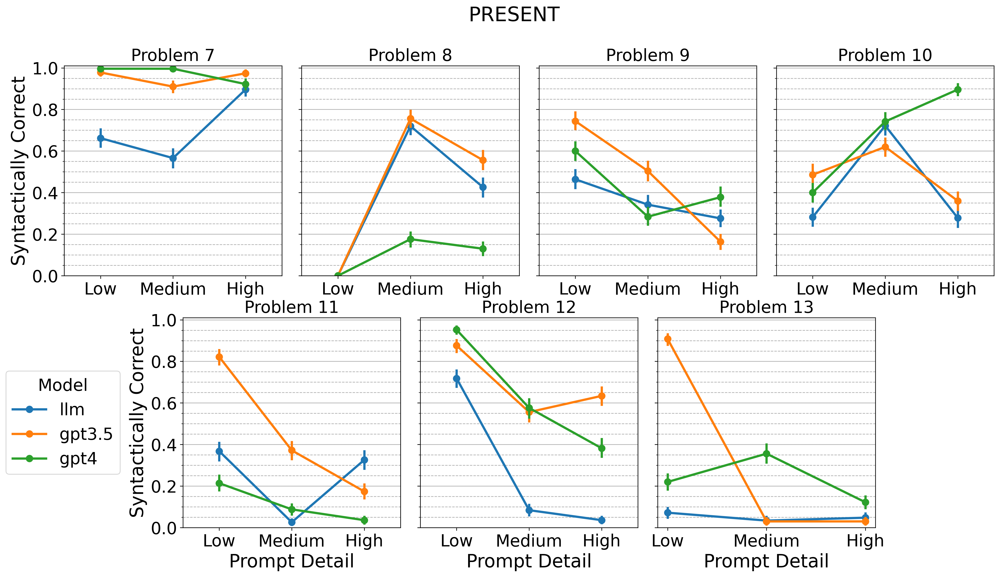

In [24]:
fig = plt.figure(figsize=(20, 10))
fig.suptitle("PRESENT")

for i, problem_id in present_probs:
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    ax = plt.subplot2grid(shape=(2,8), loc=i, colspan=2, sharey=prev_ax if problem_id in [8, 9, 10, 12, 13] else None)
    sns.pointplot(data = data[1:], x='prompt_detail', y='passed_bench', hue='model_type', order=['L', 'M', 'H'], ax=ax)
    ax.set_ylim([0, 1.01])
    ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
    ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
    ax.set_xticklabels(['Low', 'Medium', 'High'])
    if problem_id in [8, 9, 10, 12, 13]:
        for l in ax.get_yticklabels():
            l.set_visible(False) 
        ax.set_ylabel("")
    else:
        ax.set_ylabel("Syntactically Correct")
    # ax.legend(title = "Model")
    ax.legend().set_visible(False)
    ax.set_title(f"Problem {problem_id}")
    ax.grid(axis='y')
    ax.grid(axis='y', which='minor', linestyle='--')
    prev_ax = ax
    if problem_id == 11:
        ax.legend(title= "Model", loc = "center right", bbox_to_anchor=(-0.25, 0.5))
    if problem_id in [11, 12, 13]:
        ax.set_xlabel("Prompt Detail")
    else:
        ax.set_xlabel("")
plt.plot()
plt.savefig(f"figures/present_pd_fsc.pdf", bbox_inches='tight')

## pass@k

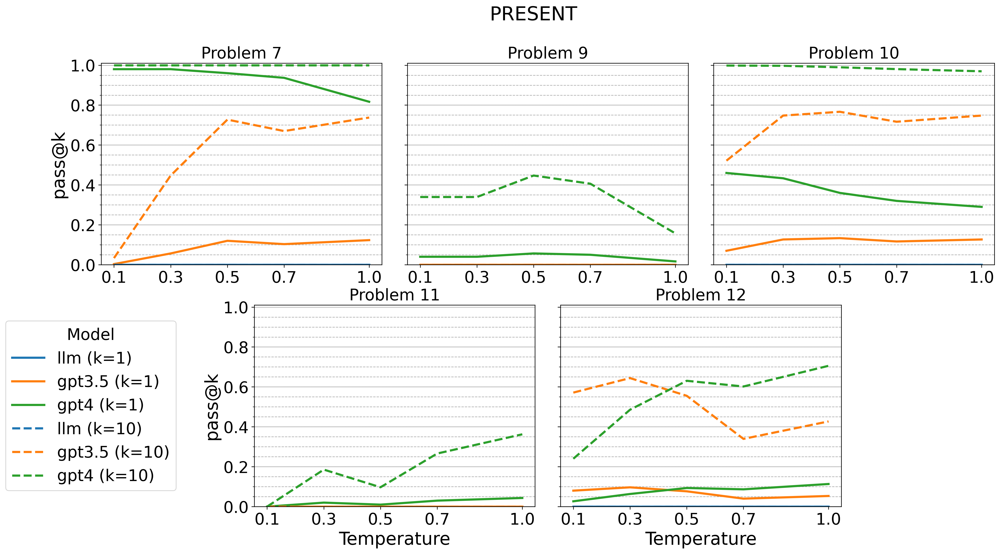

In [94]:
fig = plt.figure(figsize=(20, 10))
fig.suptitle("PRESENT")

for i, problem_id in present_probs:
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    data = data.loc[data['model_type'] != 'manual']
    ax = plt.subplot2grid(shape=(2,6), loc=i, colspan=2, sharey=prev_ax if problem_id in [8, 9, 10, 12, 13] else None)
    for k in [1, 10]:
        for m in ['llm', 'gpt3.5', 'gpt4']:
            mtrack = []
            for t in temps:
                tmp = data.loc[(data['temp'] == t) & (data['model_type'] == m)]['correct']
                pak = pass_at_k(n=len(tmp), c=tmp.sum(), k=k)
                mtrack.append(pak)
            ax.plot(temps, mtrack, label=m + f" (k={k})", linewidth=2.7, c=model_colors[m], linestyle='--' if k==10 else '-')
        ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
        ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
        ax.set_xticks(temps)
        ax.set_xlabel("Temperature")
        ax.set_ylabel(f"pass@k")
        ax.set_ylim([0,1.01])
        if problem_id in [8, 9, 10, 12, 13]:
            for l in ax.get_yticklabels():
                l.set_visible(False) 
            ax.set_ylabel("")
        ax.legend().set_visible(False)
        ax.grid(axis='y', which='major', linestyle='-')
        ax.grid(axis='y', which='minor', linestyle='--')
        ax.set_title(f"Problem {problem_id}")
        prev_ax = ax
        if problem_id == 11:
            ax.legend(title= "Model", loc = "center right", bbox_to_anchor=(-0.25, 0.5))
        if problem_id in [11, 12, 13]:
            ax.set_xlabel("Temperature")
        else:
            ax.set_xlabel("")
plt.plot()
plt.savefig(f"figures/present_temp_pass@k.pdf", bbox_inches='tight')

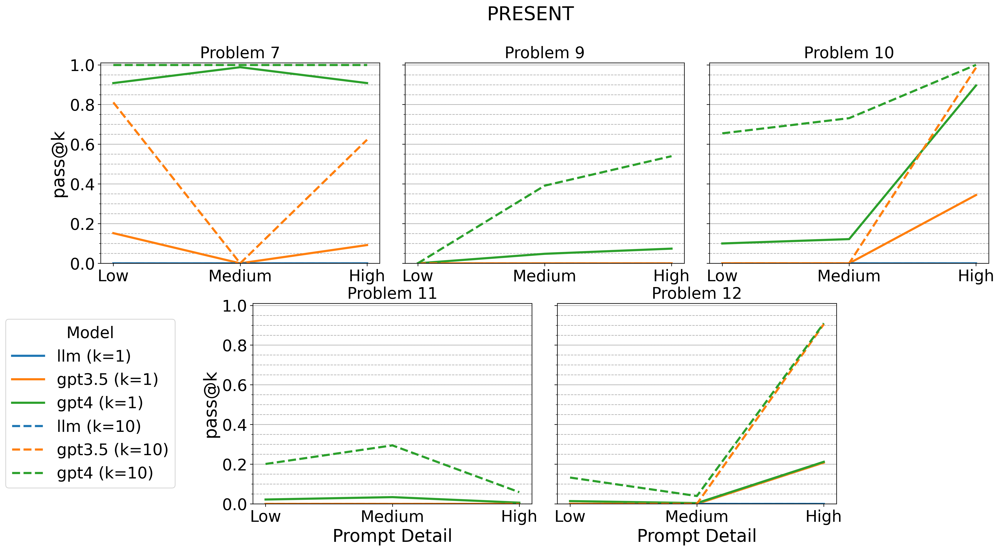

In [95]:
fig = plt.figure(figsize=(20, 10))
fig.suptitle("PRESENT")

for i, problem_id in present_probs:
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    data = data.loc[data['model_type'] != 'manual']
    ax = plt.subplot2grid(shape=(2,6), loc=i, colspan=2, sharey=prev_ax if problem_id in [8, 9, 10, 12, 13] else None)
    for k in [1, 10]:
        for m in ['llm', 'gpt3.5', 'gpt4']:
            mtrack = []
            for pd_ in pds:
                tmp = data.loc[(data['prompt_detail'] == pd_) & (data['model_type'] == m)]['correct']
                pak = pass_at_k(n=len(tmp), c=tmp.sum(), k=k)
                mtrack.append(pak)
            ax.plot(pde, mtrack, label=m + f" (k={k})", linewidth=2.7, c=model_colors[m], linestyle='--' if k==10 else '-')
        ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
        ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
        ax.set_xlabel("Prompt Detail")
        ax.set_ylabel(f"pass@k")
        ax.set_ylim([0,1.01])
        if problem_id in [8, 9, 10, 12, 13]:
            for l in ax.get_yticklabels():
                l.set_visible(False) 
            ax.set_ylabel("")
        ax.legend().set_visible(False)
        ax.grid(axis='y', which='major', linestyle='-')
        ax.grid(axis='y', which='minor', linestyle='--')
        ax.set_title(f"Problem {problem_id}")
        prev_ax = ax
        if problem_id == 11:
            ax.legend(title= "Model", loc = "center right", bbox_to_anchor=(-0.25, 0.5))
        if problem_id in [11, 12, 13]:
            ax.set_xlabel("Prompt Detail")
        else:
            ax.set_xlabel("")
plt.plot()
plt.savefig(f"figures/present_pd_pass@k.pdf", bbox_inches='tight')

# Sbox in software

In [ ]:
data = pd.read_csv("problem25/stats.csv")

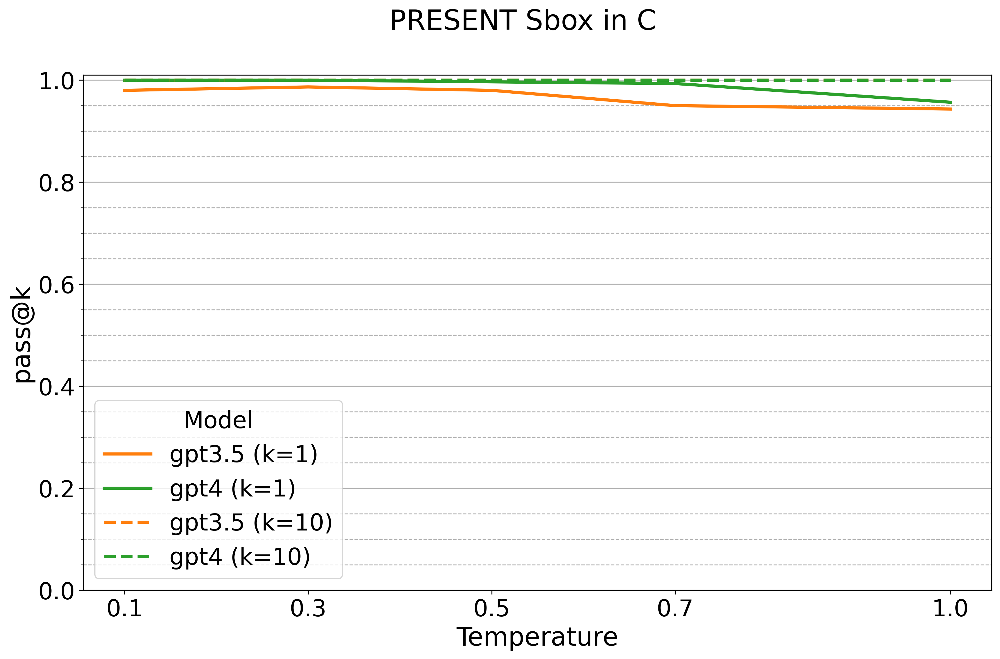

In [28]:
fig, ax = plt.subplots(figsize=(14,8))
fig.suptitle("PRESENT Sbox in C")

for k in [1, 10]:
    for m in ['gpt3.5', 'gpt4']:
        mtrack = []
        for t in temps:
            tmp = data.loc[(data['temp'] == t) & (data['model_type'] == m)]['correct']
            pak = pass_at_k(n=len(tmp), c=tmp.sum(), k=k)
            mtrack.append(pak)
        ax.plot(temps, mtrack, label=m+f" (k={k})", linewidth=2.7, c=model_colors[m], linestyle='--' if k==10 else '-')
    ax.legend(title = "Model")
    ax.grid(axis='y', which='major', linestyle='-')
    ax.grid(axis='y', which='minor', linestyle='--')
    ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
    ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
    ax.set_xticks(temps)
    ax.set_xlabel("Temperature")
    ax.set_ylabel(f"pass@k")
    ax.set_ylim([0,1.01])
    # ax.set_xticklabels(['Low', 'Medium', 'High'])
plt.plot()
plt.savefig(f"figures/sbox_temp_pass@k.pdf", bbox_inches='tight')

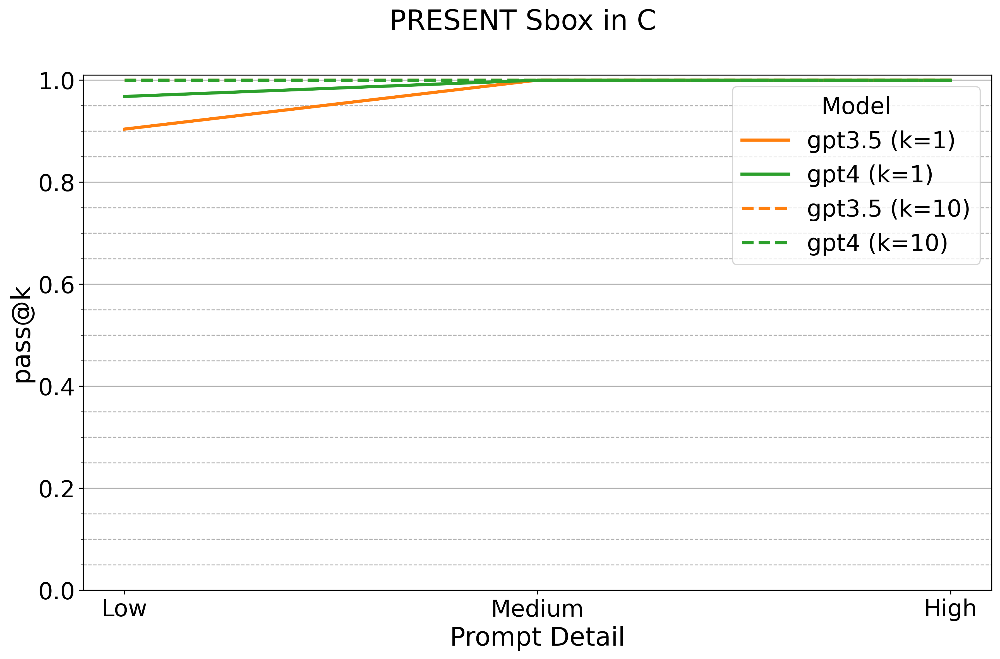

In [29]:
fig, ax = plt.subplots(figsize=(14,8))
fig.suptitle("PRESENT Sbox in C")

for k in [1, 10]:
    for m in ['gpt3.5', 'gpt4']:
        mtrack = []
        for pd_ in pds:
            tmp = data.loc[(data['prompt_detail'] == pd_) & (data['model_type'] == m)]['correct']
            pak = pass_at_k(n=len(tmp), c=tmp.sum(), k=k)
            mtrack.append(pak)
        ax.plot(pde, mtrack, label=m+f" (k={k})", linewidth=2.7, c=model_colors[m], linestyle='--' if k==10 else '-')
    ax.legend(title = "Model")
    ax.grid(axis='y', which='major', linestyle='-')
    ax.grid(axis='y', which='minor', linestyle='--')
    ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
    ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
    ax.set_xlabel("Prompt Detail")
    ax.set_ylabel(f"pass@k")
    ax.set_ylim([0,1.01])
plt.plot()
plt.savefig(f"figures/sbox_pd_pass@k.pdf", bbox_inches='tight')

# AES

In [ ]:
aes_probs = [
    ((0,0),14), 
    ((0,2),15), 
    ((0,4),16),
    ((0,6),17), 
    ((0,8),18),
    ((1,0),19),
    ((1,2),20),
    ((1,4),21),
    ((1,6),22),
    ((1,8),23),
    # ((1,9),24),
]

## pass@k

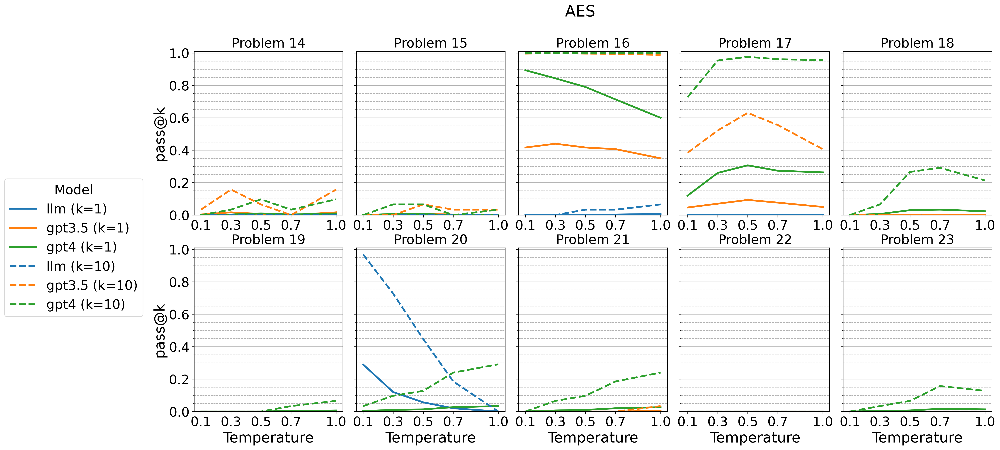

In [155]:
fig = plt.figure(figsize=(22, 10))
fig.suptitle("AES")

for i, problem_id in aes_probs:
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    ax = plt.subplot2grid(shape=(2,10), loc=i, colspan=2, sharey=prev_ax if problem_id not in [14, 19] else None)
    
    for k in [1, 10]:
        for m in ['llm', 'gpt3.5', 'gpt4']:
            mtrack = []
            for t in temps:
                tmp = data.loc[(data['temp'] == t) & (data['model_type'] == m)]['correct']
                pak = pass_at_k(n=len(tmp), c=tmp.sum(), k=k)
                mtrack.append(pak)
            ax.plot(temps, mtrack, label=m + f" (k={k})", linewidth=2.7, c=model_colors[m], linestyle='--' if k==10 else '-')    
    
    ax.set_ylim([0, 1.01])
    ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
    ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
    if problem_id not in [14, 19]:
        for l in ax.get_yticklabels():
            l.set_visible(False) 
        ax.set_ylabel("")
    else:
        ax.set_ylabel("pass@k")
    # ax.legend(title = "Model")
    ax.legend().set_visible(False)
    ax.set_title(f"Problem {problem_id}")
    ax.grid(axis='y', which='major', linestyle='-')
    ax.grid(axis='y', which='minor', linestyle='--')
    ax.set_xticks(temps)
    prev_ax = ax
    if problem_id == 19:
        ax.legend(title= "Model", loc = "center right", bbox_to_anchor=(-0.3, 1))
    if problem_id in [19, 20, 21, 22, 23, 24]:
        ax.set_xlabel("Temperature")
    else:
        ax.set_xlabel("")
plt.plot()
plt.savefig(f"figures/aes_temp_pass@k.pdf", bbox_inches='tight')

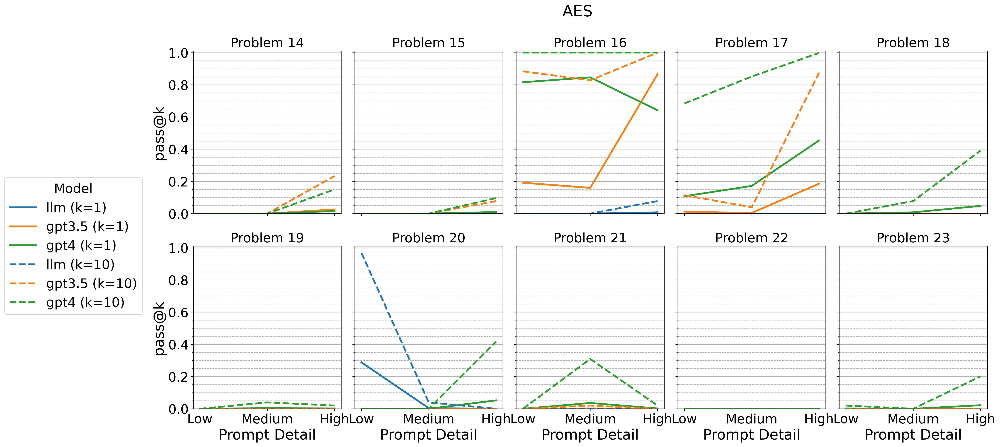

In [156]:
fig = plt.figure(figsize=(22, 10))
fig.suptitle("AES")

for i, problem_id in aes_probs:
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    ax = plt.subplot2grid(shape=(2,10), loc=i, colspan=2, sharey=prev_ax if problem_id not in [14, 19] else None)
    
    for k in [1, 10]:
        for m in ['llm', 'gpt3.5', 'gpt4']:
            mtrack = []
            for pd_ in pds:
                tmp = data.loc[(data['prompt_detail'] == pd_) & (data['model_type'] == m)]['correct']
                pak = pass_at_k(n=len(tmp), c=tmp.sum(), k=k)
                mtrack.append(pak)
            ax.plot(pde, mtrack, label=m + f" (k={k})", linewidth=2.7, c=model_colors[m], linestyle='--' if k==10 else '-')    
    
    ax.set_ylim([0, 1.01])
    ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
    ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
    if problem_id not in [14, 19]:
        for l in ax.get_yticklabels():
            l.set_visible(False) 
        ax.set_ylabel("")
    else:
        ax.set_ylabel("pass@k")
    # ax.legend(title = "Model")
    ax.legend().set_visible(False)
    ax.set_title(f"Problem {problem_id}")
    ax.grid(axis='y', which='major', linestyle='-')
    ax.grid(axis='y', which='minor', linestyle='--')
    prev_ax = ax
    if problem_id == 19:
        ax.legend(title= "Model", loc = "center right", bbox_to_anchor=(-0.3, 1))
    if problem_id in [19, 20, 21, 22, 23, 24]:
        ax.set_xlabel("Prompt Detail")
    else:
        ax.set_xlabel("")
        ax.set_xticklabels("",visible=False)
plt.plot()
plt.savefig(f"figures/aes_pd_pass@k.pdf", bbox_inches='tight')

# huge plot

In [13]:
for i, problem_id in enumerate(range(2, 25)):
    index = np.unravel_index(i, (6,4))
    index = (index[0], index[1] * 2)
    print(i, problem_id, index)


0 2 (np.int64(0), np.int64(0))
1 3 (np.int64(0), np.int64(2))
2 4 (np.int64(0), np.int64(4))
3 5 (np.int64(0), np.int64(6))
4 6 (np.int64(1), np.int64(0))
5 7 (np.int64(1), np.int64(2))
6 8 (np.int64(1), np.int64(4))
7 9 (np.int64(1), np.int64(6))
8 10 (np.int64(2), np.int64(0))
9 11 (np.int64(2), np.int64(2))
10 12 (np.int64(2), np.int64(4))
11 13 (np.int64(2), np.int64(6))
12 14 (np.int64(3), np.int64(0))
13 15 (np.int64(3), np.int64(2))
14 16 (np.int64(3), np.int64(4))
15 17 (np.int64(3), np.int64(6))
16 18 (np.int64(4), np.int64(0))
17 19 (np.int64(4), np.int64(2))
18 20 (np.int64(4), np.int64(4))
19 21 (np.int64(4), np.int64(6))
20 22 (np.int64(5), np.int64(0))
21 23 (np.int64(5), np.int64(2))
22 24 (np.int64(5), np.int64(4))


In [14]:
np.unravel_index(1, (5, 4))

(np.int64(0), np.int64(1))

In [ ]:
probs = [
    ((0,0), 2),
    ((0,2), 3),
    ((0,4), 4),
    ((0,6), 5),
    ((1,0), 6),
    ((1,2), 7),
    # ((0,4), 8),
    ((1,4), 9),
    ((1,6), 10),
    ((2,0), 11),
    ((2,2), 12),
    # ((0,6), 13),
    ((2,4), 14), 
    ((2,6), 15), 
    ((3,0), 16),
    ((3,2), 17), 
    ((3,4), 18),
    ((3,6), 19),
    ((4,0), 20),
    ((4,2), 21),
    ((4,4), 22),
    ((4,6), 23),
    # ((1,9),24),
]

In [16]:
fig = plt.figure(figsize=(22, 22))

for i, problem_id in probs:
    # index = np.unravel_index(i, (6,4))
    # i = (index[0], index[1] * 2)    
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    if 'correct' not in data.columns:
        if 'Levenshtein distance' in data.columns:
            data['correct'] = (data['Levenshtein distance'] == 0).astype(int)
        else:
            data['period'] = data[['period_low', 'period_high']].max(axis=1)
            data['correct'] = (data['period'] == 65535).astype(int)
    ax = plt.subplot2grid(shape=(5,8), loc=i, colspan=2, sharey=prev_ax if i[1] > 0 else None)

    if problem_id not in no_area_problems: # if this problem can't have a 0 area solution
        # means 0 area solutions are not correct
        data.loc[data['area'] == 0, 'correct'] = 0
    # This holds for any solution, if the area is NA then it was somehow incorrect
    data.loc[data['area'].isna(), 'correct'] = 0
        
    for k in [1, 10]:
        for m in ['llm', 'gpt3.5', 'gpt4', 'claude', 'llama', 'mistral', 'gemini']:
            mtrack = []
            for t in temps:
                tmp = data.loc[(data['temp'] == t) & (data['model_type'] == m)]['correct']
                pak = pass_at_k(n=len(tmp), c=tmp.sum(), k=k)
                mtrack.append(pak)
            ax.plot(temps, mtrack, label=m + f" (k={k})", linewidth=2.7, c=model_colors[m], linestyle='--' if k==10 else '-', marker=model_markertypes[m])    
    
    ax.set_ylim([0, 1.01])
    ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
    ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
    if i[1] > 0:
        for l in ax.get_yticklabels():
            l.set_visible(False) 
        ax.set_ylabel("")
    else:
        ax.set_ylabel("pass@k")
    # ax.legend(title = "Model")
    ax.legend().set_visible(False)
    # ax.set_title(f"Problem {problem_id}")
    ax.set_title(problemid_readable[problem_id])
    ax.grid(axis='y', which='major', linestyle='-')
    ax.grid(axis='y', which='minor', linestyle='--')
    ax.set_xticks(temps)
    prev_ax = ax
    if problem_id == 11:
        ax.legend(title= "Model", loc = "center right", bbox_to_anchor=(-0.2, 0.5))
    if i[0] == 4 or problem_id == 20:
        ax.set_xlabel("Temperature")
    else:
        ax.set_xlabel("")
        ax.set_xticklabels("")
plt.plot()
plt.savefig(f"figures/all_temp_pass@k.pdf", dpi=1000, bbox_inches='tight')

Error in callback <function _draw_all_if_interactive at 0x7f4a60c081f0> (for post_execute), with arguments args (),kwargs {}:


<Figure size 6600x6600 with 20 Axes>

In [ ]:
fig = plt.figure(figsize=(22, 22))

for i, problem_id in probs:
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    if 'correct' not in data.columns:
        if 'Levenshtein distance' in data.columns:
            data['correct'] = (data['Levenshtein distance'] == 0).astype(int)
        else:
            data['period'] = data[['period_low', 'period_high']].max(axis=1)
            data['correct'] = (data['period'] == 65535).astype(int)
    ax = plt.subplot2grid(shape=(5,8), loc=i, colspan=2, sharey=prev_ax if i[1] > 0 else None)

    if problem_id not in no_area_problems: # if this problem can't have a 0 area solution
        # means 0 area solutions are not correct
        data.loc[data['area'] == 0, 'correct'] = 0
    # This holds for any solution, if the area is NA then it was somehow incorrect
    data.loc[data['area'].isna(), 'correct'] = 0
    
    for k in [1, 10]:
        for m in ['llm', 'gpt3.5', 'gpt4', 'claude', 'llama', 'mistral', 'gemini']:
            mtrack = []
            for pd_ in pds:
                tmp = data.loc[(data['prompt_detail'] == pd_) & (data['model_type'] == m)]['correct']
                pak = pass_at_k(n=len(tmp), c=tmp.sum(), k=k)
                mtrack.append(pak)
            ax.plot(pde, mtrack, label=m + f" (k={k})", linewidth=2.7, c=model_colors[m], linestyle='--' if k==10 else '-', marker=model_markertypes[m]) 
    
    ax.set_ylim([0, 1.01])
    ax.set_yticks(np.arange(0, 1.01, 0.2), minor=False)
    ax.set_yticks(np.arange(0, 1.01, 0.05), minor=True)
    if i[1] > 0:
        for l in ax.get_yticklabels():
            l.set_visible(False) 
        ax.set_ylabel("")
    else:
        ax.set_ylabel("pass@k")
    # ax.legend(title = "Model")
    ax.legend().set_visible(False)
    # ax.set_title(f"Problem {problem_id}")
    ax.set_title(problemid_readable[problem_id])
    ax.grid(axis='y', which='major', linestyle='-')
    ax.grid(axis='y', which='minor', linestyle='--')
    prev_ax = ax
    if problem_id == 11:
        ax.legend(title= "Model", loc = "center right", bbox_to_anchor=(-0.2, 0.5))
    if i[0] == 4 or problem_id == 20:
        ax.set_xlabel("Prompt Detail")
    else:
        ax.set_xlabel("")
        ax.set_xticklabels("")
plt.plot()
plt.savefig(f"figures/all_pd_pass@k.pdf", dpi=1000, bbox_inches='tight')

# Heatmap

In [ ]:
heatmap_data = {}
for problem_id in range(1, 25):
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    if 'correct' not in data.columns:
        if 'Levenshtein distance' in data.columns:
            data['correct'] = (data['Levenshtein distance'] == 0).astype(int)
        else:
            data['period'] = data[['period_low', 'period_high']].max(axis=1)
            data['correct'] = (data['period'] == 65535).astype(int)

    if problem_id not in no_area_problems: # if this problem can't have a 0 area solution
        # means 0 area solutions are not correct
        data.loc[data['area'] == 0, 'correct'] = 0
    # This holds for any solution, if the area is NA then it was somehow incorrect
    data.loc[data['area'].isna(), 'correct'] = 0

    problem_data = {}
    problem_data['Complexity'] = problemid_challenge[problem_id]
    for k in [10]:
        for m in ['llm', 'gpt3.5', 'gpt4', 'claude', 'llama', 'mistral', 'gemini']:
            mtrack = []
            for pd_ in pds:
                tmp = data.loc[(data['prompt_detail'] == pd_) & (data['model_type'] == m)]['correct']
                pak = pass_at_k(n=len(tmp), c=tmp.sum(), k=k)
                mtrack.append(pak)
            for t in temps:
                tmp = data.loc[(data['temp'] == t) & (data['model_type'] == m)]['correct']
                pak = pass_at_k(n=len(tmp), c=tmp.sum(), k=k)
                mtrack.append(pak)
            problem_data[m.upper()] = np.max(mtrack)
            # heatmap_data.append((problemid_readable[problem_id], problemid_challenge[problem_id], m.upper(), np.max(mtrack)))
            # ax.plot(temps, mtrack, label=m + f" (k={k})", linewidth=2.7, c=model_colors[m], linestyle='--' if k==10 else '-', marker=model_markertypes[m])    
    
    heatmap_data[problemid_readable[problem_id]] = problem_data

In [ ]:
heatmap_data = pd.DataFrame(heatmap_data).T

In [50]:
heatmap_data

,Complexity,LLM,GPT3.5,GPT4,CLAUDE,LLAMA,MISTRAL,GEMINI
LFSR,Basic,0.097017,1.0,1.0,1.0,0.999999,1.0,1.0
Quark P Function,Basic,1.0,1.0,0.0,0.999971,0.849645,1.0,1.0
Quark F Function,Medium,0.0,0.832206,0.0,0.998507,0.0,1.0,1.0
Quark G Function,Medium,0.0,0.999974,0.065663,1.0,0.0,1.0,1.0
Quark H Function,Medium,0.760574,1.0,0.0,1.0,0.0,1.0,1.0
Quark Top Module,Challenging,0.0,0.0,0.0,0.999799,0.0,0.065663,0.0
Present Rotate,Basic,0.0,0.810829,1.0,1.0,1.0,0.669911,1.0
Present Round,Basic,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Present Keyschedule,Basic,0.0,0.0,0.529666,0.900978,0.0,0.323627,0.997278
Present Sbox,Medium,0.0,0.065663,1.0,1.0,0.0,0.843963,1.0


In [52]:
import matplotlib.cm as cm

COMPLEXITY_COLOURS = {
    'Basic':       'EAF3DE',   # light green
    'Medium':      'FAEEDA',   # light amber
    'Challenging': 'FCEBEB',   # light red/pink
}

def cell_hex(v, cmap='RdYlGn', alpha=0.65):
    """Map v in [0,1] to a soft hex colour. alpha=1 is full saturation;
    0.65 blends ~35% white in to keep the table readable in print."""
    r, g, b, _ = cm.get_cmap(cmap)(v)
    r = r * alpha + (1 - alpha)
    g = g * alpha + (1 - alpha)
    b = b * alpha + (1 - alpha)
    return f"{int(r*255):02X}{int(g*255):02X}{int(b*255):02X}"

def df_to_coloured_latex(df, model_cols,
                         complexity_col='Complexity',
                         fmt='{:.2f}',
                         cmap='RdYlGn', alpha=0.65,
                         caption='Best pass@10 by model and problem; '
                                 'cells coloured red (0) to green (1).',
                         model_col_width = '1.15cm',
                         label='tab:heatmap'):
    n = len(model_cols)
    cols_spec = f'l l *{{{n}}}{{R{{{model_col_width}}}}}'
    out = []
    out.append(r'\begin{table*}[t]')          # use table* for 2-col-spanning,
    out.append(r'\centering')                  # or \begin{table}[ht] for one column
    out.append(r'\footnotesize')
    out.append(r'\setlength{\tabcolsep}{4pt}')
    out.append(r'\begin{tabular}{' + cols_spec.strip() + '}')
    out.append(r'\toprule')
    out.append(' & '.join(['Problem', complexity_col] + list(model_cols)) + r' \\')
    out.append(r'\midrule')
    for idx, row in df.iterrows():
        cells = [str(idx)]
        cells.append(rf'\cellcolor[HTML]{{{COMPLEXITY_COLOURS[row[complexity_col]]}}}{row[complexity_col]}')
        for col in model_cols:
            v = float(row[col])
            colour = cell_hex(v, cmap, alpha)
            cells.append(rf'\cellcolor[HTML]{{{colour}}}{fmt.format(v)}')
        out.append(' & '.join(cells) + r' \\')
    out.append(r'\bottomrule')
    out.append(r'\end{tabular}')
    out.append(rf'\caption{{{caption}}}')
    out.append(rf'\label{{{label}}}')
    out.append(r'\end{table*}')
    return '\n'.join(out)


model_cols = ['LLM', 'GPT3.5', 'GPT4', 'CLAUDE', 'LLAMA', 'MISTRAL', 'GEMINI']
latex = df_to_coloured_latex(heatmap_data, model_cols)
print(latex)
# or: open('heatmap_table.tex', 'w').write(latex)

\begin{table*}[t]
\centering
\footnotesize
\setlength{\tabcolsep}{4pt}
\begin{tabular}{l l *{7}{R{1.15cm}}}
\toprule
Problem & Complexity & LLM & GPT3.5 & GPT4 & CLAUDE & LLAMA & MISTRAL & GEMINI \\
\midrule
LFSR & \cellcolor[HTML]{EAF3DE}Basic & \cellcolor[HTML]{E37672}0.10 & \cellcolor[HTML]{599C7D}1.00 & \cellcolor[HTML]{599C7D}1.00 & \cellcolor[HTML]{599C7D}1.00 & \cellcolor[HTML]{599C7D}1.00 & \cellcolor[HTML]{599C7D}1.00 & \cellcolor[HTML]{599C7D}1.00 \\
Quark P Function & \cellcolor[HTML]{EAF3DE}Basic & \cellcolor[HTML]{599C7D}1.00 & \cellcolor[HTML]{599C7D}1.00 & \cellcolor[HTML]{C45971}0.00 & \cellcolor[HTML]{599C7D}1.00 & \cellcolor[HTML]{82C793}0.85 & \cellcolor[HTML]{599C7D}1.00 & \cellcolor[HTML]{599C7D}1.00 \\
Quark F Function & \cellcolor[HTML]{FAEEDA}Medium & \cellcolor[HTML]{C45971}0.00 & \cellcolor[HTML]{8ACB95}0.83 & \cellcolor[HTML]{C45971}0.00 & \cellcolor[HTML]{599C7D}1.00 & \cellcolor[HTML]{C45971}0.00 & \cellcolor[HTML]{599C7D}1.00 & \cellcolor[HTML]{599C7D}1.00

# Binomial GLM

In [ ]:
import statsmodels.api as sm
import statsmodels.formula.api as smf


In [ ]:
PROMPT_DETAIL_MAP = {'L': 0, 'M': 1, 'H': 2}   # adjust if your CSV uses 'low'/'medium'/'high'

def load_problem(problem_id):
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)

    if 'correct' not in data.columns:
        if 'Levenshtein distance' in data.columns:
            data['correct'] = (data['Levenshtein distance'] == 0).astype(int)
        else:
            data['period'] = data[['period_low', 'period_high']].max(axis=1)
            data['correct'] = (data['period'] == 65535).astype(int)

    if problem_id not in no_area_problems: # if this problem can't have a 0 area solution
        # means 0 area solutions are not correct
        data.loc[data['area'] == 0, 'correct'] = 0
    # This holds for any solution, if the area is NA then it was somehow incorrect
    data.loc[data['area'].isna(), 'correct'] = 0

    data['problem_id']  = problem_id
    data['complexity']  = problemid_challenge[problem_id]
    if data['prompt_detail'].dtype == object:
        data['prompt_detail'] = data['prompt_detail'].map(PROMPT_DETAIL_MAP)
    return data

In [ ]:
MODELS = ['llm', 'gpt3.5', 'gpt4', 'claude', 'llama', 'mistral', 'gemini']
records = []
TEMP_LO, TEMP_HI = 0.1, 1.0
PD_LO,   PD_HI   = 0, 2

for problem_id in range(1, 25):
    if problem_id in [13, 18, 22]:
        continue
    data = load_problem(problem_id)

    for m in MODELS:
        tmp = data.loc[data['model_type'] == m]
        pass1 = pass_at_k(n=len(tmp), c=tmp['correct'].sum(), k=1)

        if pass1 < 0.05 or pass1 > 0.95:
            records.append({'model_type': m, 'problem_id': problem_id,
                        'effect_temp': np.nan, 'effect_pd': np.nan, 'note': 'degenerate'})
            continue

        X = sm.add_constant(tmp[['temp', 'prompt_detail']], has_constant='add')
        try:
            res = sm.GLM(tmp['correct'], X, family=sm.families.Binomial()).fit(disp=False)
    
            # average over PD when changing temp, and vice versa
            Xt_lo = X.copy()
            Xt_lo['temp'] = TEMP_LO
            Xt_hi = X.copy()
            Xt_hi['temp'] = TEMP_HI
            Xp_lo = X.copy()
            Xp_lo['prompt_detail'] = PD_LO
            Xp_hi = X.copy()
            Xp_hi['prompt_detail'] = PD_HI
    
            eff_t  = res.predict(Xt_hi).mean() - res.predict(Xt_lo).mean()
            eff_pd = res.predict(Xp_hi).mean() - res.predict(Xp_lo).mean()
    
            records.append({'model_type': m, 'problem_id': problem_id,
                            'effect_temp': eff_t, 'effect_pd': eff_pd, 'note': 'fine'})
        except Exception as e:
            records.append({'model_type': m, 'problem_id': problem_id,
                            'effect_temp': np.nan, 'effect_pd': np.nan,
                            'note': f'error: {type(e).__name__}'})

eff = pd.DataFrame(records)
mat_temp = eff.pivot(index='problem_id', columns='model_type', values='effect_temp')
mat_pd   = eff.pivot(index='problem_id', columns='model_type', values='effect_pd')

In [80]:
max(mat_temp.abs().max().max(), mat_pd.abs().max().max())

0.9999999999988097

In [ ]:
def diverging_hex(v, vmax=0.4, alpha=0.65):
    """Map v in [-vmax, +vmax] to hex via RdYlGn diverging palette,
    softened by blending alpha of the colour with white."""
    if pd.isna(v):
        return 'EAEAEA'                       # neutral gray for missing
    t = max(-1.0, min(1.0, v / vmax))         # clip to ±1
    t = (t + 1) / 2                           # map to [0, 1]
    return cell_hex(t, alpha=alpha)
    
def combined_effect_heatmap_latex(
        mat_temp, mat_pd,
        sub_col_width='0.55cm',
        alpha=0.65,
        caption='Per-(model, problem) change in pass@1 from low to high '
                'setting of each factor (T = temperature, P = prompt detail), '
                'averaged over the other factor. Green = positive, red = '
                'negative, gray = degenerate fit.',
        label='tab:effects'):
    n = len(MODELS)
    # l (problem) + l (complexity) + 2 sub-columns per model
    cols_spec = 'l l ' + ' '.join(
        [f'P{{{sub_col_width}}} P{{{sub_col_width}}}' for _ in MODELS]
    )
    out = []
    out.append(r'\begin{tabular}{' + cols_spec + '}')
    out.append(r'\toprule')

    # Top header: model names spanning two sub-columns
    top = [' ', ' '] + [rf'\multicolumn{{2}}{{c}}{{{m.upper()}}}' for m in MODELS]
    out.append(' & '.join(top) + r' \\')
    # Mid-rule under model names but not under "Problem"/"Complexity"
    cmid_specs = ' '.join([rf'\cmidrule(lr){{{2*i+3}-{2*i+4}}}'
                           for i in range(n)])
    out.append(cmid_specs)

    # Sub-header: T / P for each model
    sub = ['Problem', 'Complexity']
    for _ in MODELS:
        sub.extend([r'$T$', r'$P$'])
    out.append(' & '.join(sub) + r' \\')
    out.append(r'\midrule')

    vmax_t = mat_temp.abs().max().max()
    vmax_p = mat_pd.abs().max().max()
    
    # Body
    tier_colour = {'Basic':'EAF3DE','Medium':'FAEEDA','Challenging':'FCEBEB'}
    for pid in mat_temp.index:
        complexity = problemid_challenge[pid]
        cells = [problemid_readable[pid]]
        cells.append(rf'\cellcolor[HTML]{{{COMPLEXITY_COLOURS.get(complexity)}}}{complexity}')
        for m in MODELS:
            vt = mat_temp.loc[pid, m]
            vp = mat_pd.loc[pid, m]
            colour_t = diverging_hex(vt, vmax=vmax_t, alpha=alpha)
            colour_p = diverging_hex(vp, vmax=vmax_p, alpha=alpha)
            txt_t = '--' if pd.isna(vt) else f'{vt:+.2f}'
            txt_p = '--' if pd.isna(vp) else f'{vp:+.2f}'
            cells.append(rf'\cellcolor[HTML]{{{colour_t}}}{txt_t}')
            cells.append(rf'\cellcolor[HTML]{{{colour_p}}}{txt_p}')
        out.append(' & '.join(cells) + r' \\')
    out.append(r'\bottomrule')
    out.append(r'\end{tabular}')
    return '\n'.join(out)

In [92]:
print(combined_effect_heatmap_latex(mat_temp, mat_pd))

\begin{tabular}{l l P{0.55cm} P{0.55cm} P{0.55cm} P{0.55cm} P{0.55cm} P{0.55cm} P{0.55cm} P{0.55cm} P{0.55cm} P{0.55cm} P{0.55cm} P{0.55cm} P{0.55cm} P{0.55cm}}
\toprule
  &   & \multicolumn{2}{c}{LLM} & \multicolumn{2}{c}{GPT3.5} & \multicolumn{2}{c}{GPT4} & \multicolumn{2}{c}{CLAUDE} & \multicolumn{2}{c}{LLAMA} & \multicolumn{2}{c}{MISTRAL} & \multicolumn{2}{c}{GEMINI} \\
\cmidrule(lr){3-4} \cmidrule(lr){5-6} \cmidrule(lr){7-8} \cmidrule(lr){9-10} \cmidrule(lr){11-12} \cmidrule(lr){13-14} \cmidrule(lr){15-16}
Problem & Complexity & $T$ & $P$ & $T$ & $P$ & $T$ & $P$ & $T$ & $P$ & $T$ & $P$ & $T$ & $P$ & $T$ & $P$ \\
\midrule
LFSR & \cellcolor[HTML]{EAF3DE}Basic & \cellcolor[HTML]{EAEAEA}-- & \cellcolor[HTML]{EAEAEA}-- & \cellcolor[HTML]{F1937F}-0.29 & \cellcolor[HTML]{5CA280}+0.96 & \cellcolor[HTML]{FEFBCF}-0.02 & \cellcolor[HTML]{5CA280}+0.96 & \cellcolor[HTML]{EAEAEA}-- & \cellcolor[HTML]{EAEAEA}-- & \cellcolor[HTML]{FEDCA7}-0.13 & \cellcolor[HTML]{74C18F}+0.75 & \cellcolor[HTML]{FD

# Expected nr. completions dataset

In [ ]:
E_data = []

for problem_id in range(2, 23):
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    if 'correct' not in data.columns:
        data['correct'] = (data['Levenshtein distance'] == 0).astype(int)

    if problem_id not in no_area_problems: # if this problem can't have a 0 area solution
        # means 0 area solutions are not correct
        data.loc[data['area'] == 0, 'correct'] = 0
    # This holds for any solution, if the area is NA then it was somehow incorrect
    data.loc[data['area'].isna(), 'correct'] = 0
    
    for m in ['llm', 'gpt3.5', 'gpt4']:
        tmp = data.loc[data['model_type'] == m]['correct']
        E_data.append([problem_id, m, "NA", "NA", E_trials(n=len(tmp), c=tmp.sum())])
        for pd_ in pds:
            tmp = data.loc[(data['prompt_detail'] == pd_) & (data['model_type'] == m)]['correct']
            E_data.append([problem_id, m, pd_, "NA", E_trials(n=len(tmp), c=tmp.sum())])
        for t in temps:
            tmp = data.loc[(data['temp'] == t) & (data['model_type'] == m)]['correct']
            E_data.append([problem_id, m, "NA", t, E_trials(n=len(tmp), c=tmp.sum())])

E_data = pd.DataFrame(E_data, columns = ['problem_id', 'model', 'prompt_detail', 'temperature', 'E_trials'])

In [47]:
E_data

,problem_id,model,prompt_detail,temperature,E_trials
0,2,llm,NA,NA,1.941176
1,2,llm,L,NA,inf
2,2,llm,M,NA,5.493506
3,2,llm,H,NA,0.154734
4,2,llm,NA,0.1,2.000000
...,...,...,...,...,...
562,22,gpt4,NA,0.1,inf
563,22,gpt4,NA,0.3,inf
564,22,gpt4,NA,0.5,inf
565,22,gpt4,NA,0.7,inf


# Area table

In [55]:
area_ref = []

for problem_id in range(1, 25):
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    area_ref.append([problem_id, data.loc[0, 'area']])
area_ref

[[1, 28.508159],
 [2, 0.442368],
 [3, 13.713408],
 [4, 13.713408],
 [5, 9.09312],
 [6, 540.868606],
 [7, 0.0],
 [8, 140.771329],
 [9, 9.240576],
 [10, 7.028736],
 [11, 112.459777],
 [12, 0.0],
 [13, 637.698039],
 [14, 2106.851357],
 [15, 1837.891612],
 [16, 1.327104],
 [17, 4.866048],
 [18, 505.479175],
 [19, 448.856071],
 [20, 0.0],
 [21, 1781.268508],
 [22, 111.329282],
 [23, 268.959744],
 [24, 6664.274]]

In [56]:
print(pd.DataFrame(area_ref, columns=['Problem ID', 'Area']).to_latex(index=False, float_format="%.3f"))

\begin{tabular}{rr}
\toprule
Problem ID & Area \\
\midrule
1 & 28.508 \\
2 & 0.442 \\
3 & 13.713 \\
4 & 13.713 \\
5 & 9.093 \\
6 & 540.869 \\
7 & 0.000 \\
8 & 140.771 \\
9 & 9.241 \\
10 & 7.029 \\
11 & 112.460 \\
12 & 0.000 \\
13 & 637.698 \\
14 & 2106.851 \\
15 & 1837.892 \\
16 & 1.327 \\
17 & 4.866 \\
18 & 505.479 \\
19 & 448.856 \\
20 & 0.000 \\
21 & 1781.269 \\
22 & 111.329 \\
23 & 268.960 \\
24 & 6664.274 \\
\bottomrule
\end{tabular}



In [ ]:
def comp_ref(row):
    if area_ref[row['Problem ID']] > row['Minimum']:
        row['Model'] = row['Model'] + '*'
    return row

In [57]:
area_table = []
for problem_id in range(1, 25):
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    if 'correct' not in data.columns:
        if 'Levenshtein distance' in data.columns:
            data['correct'] = (data['Levenshtein distance'] == 0).astype(int)
        else:
            data['period'] = data[['period_low', 'period_high']].max(axis=1)
            data['correct'] = (data['period'] == 65535).astype(int)

    if problem_id not in no_area_problems: # if this problem can't have a 0 area solution
        # means 0 area solutions are not correct
        data.loc[data['area'] == 0, 'correct'] = 0
    # This holds for any solution, if the area is NA then it was somehow incorrect
    data.loc[data['area'].isna(), 'correct'] = 0
    
    for m in ['llm', 'gpt3.5', 'gpt4', 'claude', 'llama', 'mistral', 'gemini']:
        area_nrs = data.loc[(data['model_type'] == m) & (data['correct'] == 1)]['area']
        if len(area_nrs) > 0:
            area_table.append([problem_id, m, len(area_nrs), area_nrs.min(), area_nrs.median(), area_nrs.mean(), area_nrs.max(), area_nrs.std()])

area_table = pd.DataFrame(area_table, columns=['Problem ID', 'Model', 'len', 'Minimum', 'Median', 'mean', 'Maximum', 'STD'])
area_table['Model'] = area_table['Model'].str.capitalize()
# area_table['Model'] = area_table['Model'].apply(lambda x: x.replace('Gpt', 'GPT'))
# area_table = area_table.apply(comp_ref, axis=1)
area_table

,Problem ID,Model,len,Minimum,Median,mean,Maximum,STD
0,1,Llm,5,21.774335,28.508159,39.056179,65.372160,2.087941e+01
1,1,Gpt3.5,682,21.921791,21.921791,22.028023,28.508159,8.303054e-01
2,1,Gpt4,494,21.921791,21.921791,21.950944,29.736959,4.593788e-01
3,1,Claude,1435,21.921791,21.921791,21.921791,21.921791,3.553952e-15
4,1,Llama,441,21.774335,21.921791,23.770731,28.508159,2.966385e+00
...,...,...,...,...,...,...,...,...
90,22,Gemini,39,111.329282,111.329282,115.116507,128.040962,7.017076e+00
91,23,Gpt4,12,191.102976,192.724992,192.921600,198.770688,1.944401e+00
92,23,Claude,1487,191.102976,191.102976,191.669397,205.406208,9.786549e-01
93,23,Mistral,60,191.102976,191.102976,193.481933,268.959744,1.024420e+01


In [49]:
print(area_table.loc[area_table['STD'] > 0.01,].drop(['mean', 'len'], axis=1).to_latex(index=False, float_format="%.3f"))

\begin{tabular}{rlrrrr}
\toprule
Problem ID & Model & Minimum & Median & Maximum & STD \\
\midrule
1 & Llm & 21.774 & 28.508 & 65.372 & 20.879 \\
1 & Gpt3.5 & 21.922 & 21.922 & 28.508 & 0.830 \\
1 & Gpt4 & 21.922 & 21.922 & 29.737 & 0.459 \\
1 & Llama & 21.774 & 21.922 & 28.508 & 2.966 \\
1 & Mistral & 21.922 & 21.922 & 28.508 & 0.335 \\
1 & Gemini & 28.508 & 28.508 & 29.737 & 0.163 \\
3 & Gpt3.5 & 12.435 & 13.713 & 13.713 & 0.599 \\
3 & Claude & 11.993 & 12.435 & 14.893 & 0.433 \\
3 & Mistral & 12.337 & 12.435 & 14.352 & 0.618 \\
3 & Gemini & 12.435 & 13.713 & 13.713 & 0.059 \\
4 & Gpt3.5 & 11.256 & 13.713 & 13.713 & 0.331 \\
4 & Claude & 11.993 & 12.435 & 14.500 & 0.412 \\
4 & Mistral & 12.337 & 13.713 & 13.713 & 0.618 \\
4 & Gemini & 12.435 & 13.713 & 13.713 & 0.075 \\
5 & Gpt3.5 & 9.093 & 9.093 & 9.781 & 0.071 \\
5 & Claude & 8.995 & 9.093 & 9.388 & 0.013 \\
5 & Mistral & 7.963 & 9.093 & 9.634 & 0.094 \\
5 & Gemini & 8.552 & 9.093 & 9.634 & 0.038 \\
6 & Claude & 282.083 & 455.885 &

In [302]:
print(area_table.loc[area_table['STD'] <= 0.01,].drop(['mean', 'len', 'Median', 'Maximum', 'STD'], axis=1).to_latex(index=False, float_format="%.3f"))

\begin{tabular}{rlr}
\toprule
Problem ID & Model & Minimum \\
\midrule
1 & Claude* & 21.922 \\
2 & Llm & 0.442 \\
2 & GPT3.5 & 0.442 \\
2 & Claude & 0.442 \\
2 & Llama & 0.442 \\
2 & Mistral & 0.442 \\
2 & Gemini & 0.442 \\
4 & GPT4 & 13.713 \\
5 & Llm & 9.093 \\
7 & GPT3.5 & 0.000 \\
7 & GPT4 & 0.000 \\
7 & Claude & 0.000 \\
7 & Llama & 0.000 \\
7 & Mistral & 0.000 \\
7 & Gemini & 0.000 \\
9 & Claude & 9.241 \\
9 & Mistral & 9.241 \\
10 & Claude & 7.029 \\
12 & GPT3.5 & 0.000 \\
12 & Claude & 0.000 \\
12 & Mistral & 0.000 \\
12 & Gemini & 0.000 \\
14 & GPT3.5 & 2106.851 \\
14 & GPT4 & 2106.851 \\
14 & Mistral & 2106.851 \\
15 & GPT3.5 & 1837.892 \\
15 & Mistral & 1837.892 \\
16 & Llm & 1.327 \\
16 & GPT3.5 & 1.327 \\
16 & GPT4 & 1.327 \\
16 & Claude & 1.327 \\
16 & Llama & 1.327 \\
16 & Mistral & 1.327 \\
16 & Gemini & 1.327 \\
17 & GPT3.5* & 3.981 \\
17 & Mistral* & 3.981 \\
18 & GPT4 & 505.479 \\
18 & Mistral & 505.479 \\
18 & Gemini & 505.479 \\
19 & GPT4 & 448.856 \\
19 & Mistral 

In [263]:
print(area_table.loc[~area_table.isna().any(axis=1),].drop(['mean', 'len'], axis=1).to_latex(index=False, float_format="%.3f"))

\begin{tabular}{rlrrrr}
\toprule
Problem ID & Model & Minimum & Median & Maximum & STD \\
\midrule
1 & Llm & 21.774 & 28.508 & 65.372 & 20.879 \\
1 & Gpt3.5 & 21.922 & 21.922 & 28.508 & 0.830 \\
1 & Gpt4 & 21.922 & 21.922 & 29.737 & 0.459 \\
1 & Claude & 21.922 & 21.922 & 21.922 & 0.000 \\
1 & Llama & 21.774 & 21.922 & 28.508 & 2.966 \\
1 & Mistral & 21.922 & 21.922 & 28.508 & 0.335 \\
1 & Gemini & 28.508 & 28.508 & 29.737 & 0.163 \\
2 & Llm & 0.442 & 0.442 & 0.442 & 0.000 \\
2 & Gpt3.5 & 0.442 & 0.442 & 0.442 & 0.000 \\
2 & Claude & 0.442 & 0.442 & 0.442 & 0.000 \\
2 & Llama & 0.442 & 0.442 & 0.442 & 0.000 \\
2 & Mistral & 0.442 & 0.442 & 0.442 & 0.000 \\
2 & Gemini & 0.442 & 0.442 & 0.442 & 0.000 \\
3 & Gpt3.5 & 12.435 & 13.713 & 13.713 & 0.599 \\
3 & Claude & 11.993 & 12.435 & 14.893 & 0.433 \\
3 & Mistral & 12.337 & 12.435 & 14.352 & 0.618 \\
3 & Gemini & 12.435 & 13.713 & 13.713 & 0.059 \\
4 & Gpt3.5 & 11.256 & 13.713 & 13.713 & 0.331 \\
4 & Gpt4 & 13.713 & 13.713 & 13.713 & 0.000

# Big Table

In [70]:
big_table = []
for problem_id in range(1, 25):
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    if 'correct' not in data.columns:
        if 'Levenshtein distance' in data.columns:
            data['correct'] = (data['Levenshtein distance'] == 0).astype(int)
        else:
            data['period'] = data[['period_low', 'period_high']].max(axis=1)
            data['correct'] = (data['period'] == 65535).astype(int)

    if problem_id not in no_area_problems: # if this problem can't have a 0 area solution
        # means 0 area solutions are not correct
        data.loc[data['area'] == 0, 'correct'] = 0
    # This holds for any solution, if the area is NA then it was somehow incorrect
    data.loc[data['area'].isna(), 'correct'] = 0
    if (problem_id == 10):
        print(data.loc[(data['correct'] == 1) & (data['model_type'] == 'gpt3.5')])
        
    for m in ['llm', 'gpt3.5', 'gpt4', 'claude', 'llama', 'mistral', 'gemini']:
        tmp = data.loc[data['model_type'] == m]['correct']
        big_table.append([problem_id, m, "NA", "NA", 
                       pass_at_k(n=len(tmp), c=tmp.sum(), k=1), 
                       pass_at_k(n=len(tmp), c=tmp.sum(), k=10),
                       E_trials(n=len(tmp), c=tmp.sum()),
                       E_trials2(n=len(tmp), c=tmp.sum()),
                         tmp.sum() / len(tmp)])
        # tmp = data.loc[data['model_type'] == m]['passed_bench']
        
        # for pd_ in pds:
        #     tmp = data.loc[(data['prompt_detail'] == pd_) & (data['model_type'] == m)]['correct']
        #     big_table.append([problem_id, m, pd_, "NA", 
        #                    pass_at_k(n=len(tmp), c=tmp.sum(), k=1), 
        #                    pass_at_k(n=len(tmp), c=tmp.sum(), k=10),
        #                    E_trials(n=len(tmp), c=tmp.sum()),
        #                      E_trials2(n=len(tmp), c=tmp.sum()),
        #                      tmp.sum() / len(tmp)])
        # for t in temps:
        #     tmp = data.loc[(data['temp'] == t) & (data['model_type'] == m)]['correct']
        #     big_table.append([problem_id, m, "NA", t, 
        #                    pass_at_k(n=len(tmp), c=tmp.sum(), k=1), 
        #                    pass_at_k(n=len(tmp), c=tmp.sum(), k=10),
        #                    E_trials(n=len(tmp), c=tmp.sum()),
        #                      E_trials2(n=len(tmp), c=tmp.sum()),
        #                      tmp.sum() / len(tmp)])

                                      file_name model_type prompt_detail  \
2974  completions_gpt3.5/completion_H_t1.0_73.v     gpt3.5             H   
2990  completions_gpt3.5/completion_H_t1.0_89.v     gpt3.5             H   

      temp  completion_id  compiled  passed_bench  correct  \
2974   1.0           73.0         1             1        1   
2990   1.0           89.0         1             1        1   

                first CT  Levenshtein distance      area  
2974  5579C1387B228445\n                   0.0  7.028736  
2990  5579C1387B228445\n                   0.0  7.028736  


In [ ]:
big_table = pd.DataFrame(big_table, columns=['Problem ID', 'Model', 'Prompt Detail', 'Temperature', 'Pass@1', 'Pass@10', 'E@1', 'E@1 using pass@1', 'p'])
big_table['Model'] = big_table['Model'].str.capitalize()
# big_table['Model'] = big_table['Model'].apply(lambda x: x.replace('Gpt', 'GPT'))


# Merge everything for MONSTER TABLE

In [ ]:
def monster_ref(row):
    if row['Reference Area'] > row['Area Minimum']:
        row['Model'] = row['Model'] + '*'
    return row

In [72]:
monster_table = pd.merge(area_table.drop(["len", "mean"], axis=1), big_table.drop(["Prompt Detail", "Temperature", "E@1 using pass@1", "p"], axis=1), how="inner", on=["Problem ID", "Model"])
monster_table = pd.merge(monster_table, pd.DataFrame(area_ref, columns=['Problem ID', 'Reference Area']), how="left", on=["Problem ID"])
monster_table.columns = ["Problem ID", "Model", "Area Minimum", "Area Median", "Area Maximum", "Area SD", "Pass@1", "Pass@10", "E@1", "Reference Area"]
monster_table['Model'] = monster_table['Model'].apply(lambda x: x.replace('Gpt', 'GPT'))
monster_table = monster_table.apply(monster_ref, axis=1)
monster_table = monster_table.loc[:, ["Problem ID", "Model", "Area Minimum", "Area Median", "Area Maximum", "Area SD", "Reference Area", "Pass@1", "Pass@10", "E@1"]]
monster_table

,Problem ID,Model,Area Minimum,Area Median,Area Maximum,Area SD,Reference Area,Pass@1,Pass@10,E@1
0,1,Llm*,21.774335,28.508159,65.372160,2.087941e+01,28.508159,0.003333,0.032935,299.000000
1,1,GPT3.5*,21.921791,21.921791,28.508159,8.303054e-01,28.508159,0.454667,0.997732,1.199413
2,1,GPT4*,21.921791,21.921791,29.736959,4.593788e-01,28.508159,0.329333,0.981860,2.036437
3,1,Claude*,21.921791,21.921791,21.921791,3.553952e-15,28.508159,0.956667,1.000000,0.045296
4,1,Llama*,21.774335,21.921791,28.508159,2.966385e+00,28.508159,0.294000,0.969620,2.401361
...,...,...,...,...,...,...,...,...,...,...
90,22,Gemini,111.329282,111.329282,128.040962,7.017076e+00,111.329282,0.026000,0.232214,37.461538
91,23,GPT4*,191.102976,192.724992,198.770688,1.944401e+00,268.959744,0.008000,0.077405,124.000000
92,23,Claude*,191.102976,191.102976,205.406208,9.786549e-01,268.959744,0.991333,1.000000,0.008742
93,23,Mistral*,191.102976,191.102976,268.959744,1.024420e+01,268.959744,0.040000,0.336001,24.000000


In [73]:
print(monster_table.loc[(monster_table['Model'].str.endswith("*")) | (monster_table['Area SD'] > 0.01), ["Problem ID", "Reference Area"]].drop_duplicates().to_latex(index=False, float_format="%.3f"))


\begin{tabular}{rr}
\toprule
Problem ID & Reference Area \\
\midrule
1 & 28.508 \\
3 & 13.713 \\
4 & 13.713 \\
5 & 9.093 \\
6 & 540.869 \\
9 & 9.241 \\
10 & 7.029 \\
11 & 112.460 \\
12 & 0.000 \\
14 & 2106.851 \\
15 & 1837.892 \\
17 & 4.866 \\
19 & 448.856 \\
21 & 1781.269 \\
22 & 111.329 \\
23 & 268.960 \\
\bottomrule
\end{tabular}



In [75]:
no_area_problems

[7, 12, 20]

In [84]:
tmp = monster_table.loc[(monster_table['Model'].str.endswith("*")) | (monster_table['Area SD'] > 0.01), ["Problem ID", "Model", "Area Minimum", "Area Median", "Area Maximum", "Area SD", "E@1"]].to_latex(index=False, float_format="%.3f")
latex_lines = []
for l in tmp.split("\n"):
    if "*" in l:
        latex_lines.append(r"\rowcolor{gray!25}" + l)
    else:
        latex_lines.append(l)
print("\n".join(latex_lines))

\begin{tabular}{rlrrrrr}
\toprule
Problem ID & Model & Area Minimum & Area Median & Area Maximum & Area SD & E@1 \\
\midrule
\rowcolor{gray!25}1 & Llm* & 21.774 & 28.508 & 65.372 & 20.879 & 299.000 \\
\rowcolor{gray!25}1 & GPT3.5* & 21.922 & 21.922 & 28.508 & 0.830 & 1.199 \\
\rowcolor{gray!25}1 & GPT4* & 21.922 & 21.922 & 29.737 & 0.459 & 2.036 \\
\rowcolor{gray!25}1 & Claude* & 21.922 & 21.922 & 21.922 & 0.000 & 0.045 \\
\rowcolor{gray!25}1 & Llama* & 21.774 & 21.922 & 28.508 & 2.966 & 2.401 \\
\rowcolor{gray!25}1 & Mistral* & 21.922 & 21.922 & 28.508 & 0.335 & 0.938 \\
1 & Gemini & 28.508 & 28.508 & 29.737 & 0.163 & 0.005 \\
\rowcolor{gray!25}3 & GPT3.5* & 12.435 & 13.713 & 13.713 & 0.599 & 8.554 \\
\rowcolor{gray!25}3 & Claude* & 11.993 & 12.435 & 14.893 & 0.433 & 3.518 \\
\rowcolor{gray!25}3 & Mistral* & 12.337 & 12.435 & 14.352 & 0.618 & 1.708 \\
\rowcolor{gray!25}3 & Gemini* & 12.435 & 13.713 & 13.713 & 0.059 & 0.589 \\
\rowcolor{gray!25}4 & GPT3.5* & 11.256 & 13.713 & 13.713 & 

In [314]:
big_table.loc[big_table['Pass@1'] > 0][['Problem ID', 'Model', 'Pass@1', 'Pass@10', 'E@1', 'E@1 using pass@1', 'p']]


,Problem ID,Model,Pass@1,Pass@10,E@1,E@1 using pass@1,p
0,1,Llm,0.003333,0.032935,299.000000,299.000000,0.003333
1,1,GPT3.5,0.459333,0.997920,1.177068,1.177068,0.459333
2,1,GPT4,0.338000,0.984082,1.958580,1.958580,0.338000
3,1,Claude,0.956667,1.000000,0.045296,0.045296,0.956667
4,1,Llama,0.294000,0.969620,2.401361,2.401361,0.294000
...,...,...,...,...,...,...,...
153,22,Gemini,0.040667,0.340613,23.590164,23.590164,0.040667
156,23,GPT4,0.008000,0.077405,124.000000,124.000000,0.008000
157,23,Claude,0.991333,1.000000,0.008742,0.008742,0.991333
159,23,Mistral,0.040000,0.336001,24.000000,24.000000,0.040000


In [312]:
print(big_table.loc[big_table['Pass@1'] > 0][['Problem ID', 'Model', 'Pass@1', 'Pass@10', 'E@1']].to_latex(index=False, float_format="%.3f"))

\begin{tabular}{rlrrr}
\toprule
Problem ID & Model & Pass@1 & Pass@10 & E@1 \\
\midrule
1 & Llm & 0.003 & 0.033 & 299.000 \\
1 & GPT3.5 & 0.459 & 0.998 & 1.177 \\
1 & GPT4 & 0.338 & 0.984 & 1.959 \\
1 & Claude & 0.957 & 1.000 & 0.045 \\
1 & Llama & 0.294 & 0.970 & 2.401 \\
1 & Mistral & 0.517 & 0.999 & 0.935 \\
1 & Gemini & 0.995 & 1.000 & 0.005 \\
2 & Llm & 0.341 & 0.985 & 1.935 \\
2 & GPT3.5 & 0.651 & 1.000 & 0.535 \\
2 & Claude & 0.215 & 0.912 & 3.644 \\
2 & Llama & 0.103 & 0.665 & 8.677 \\
2 & Mistral & 0.581 & 1.000 & 0.722 \\
2 & Gemini & 0.667 & 1.000 & 0.500 \\
3 & GPT3.5 & 0.105 & 0.673 & 8.494 \\
3 & Claude & 0.221 & 0.919 & 3.518 \\
3 & Mistral & 0.370 & 0.990 & 1.703 \\
3 & Gemini & 0.629 & 1.000 & 0.589 \\
4 & GPT3.5 & 0.272 & 0.959 & 2.676 \\
4 & GPT4 & 0.001 & 0.013 & 749.000 \\
4 & Claude & 0.357 & 0.988 & 1.799 \\
4 & Mistral & 0.497 & 0.999 & 1.013 \\
4 & Gemini & 0.648 & 1.000 & 0.543 \\
5 & Llm & 0.044 & 0.363 & 21.727 \\
5 & GPT3.5 & 0.314 & 0.977 & 2.185 \\
5 & Cl

In [326]:
big_table

,Problem ID,Model,Prompt Detail,Temperature,Pass@1,Pass@10,E@1,E@1 using pass@1,p
0,1,Llm,NA,NA,0.003333,0.032935,299.000000,299.000000,0.003333
1,1,GPT3.5,NA,NA,0.459333,0.997920,1.177068,1.177068,0.459333
2,1,GPT4,NA,NA,0.338000,0.984082,1.958580,1.958580,0.338000
3,1,Claude,NA,NA,0.956667,1.000000,0.045296,0.045296,0.956667
4,1,Llama,NA,NA,0.294000,0.969620,2.401361,2.401361,0.294000
...,...,...,...,...,...,...,...,...,...
163,24,GPT4,NA,NA,0.000000,0.000000,inf,inf,0.000000
164,24,Claude,NA,NA,0.000000,0.000000,inf,inf,0.000000
165,24,Llama,NA,NA,0.000000,0.000000,inf,inf,0.000000
166,24,Mistral,NA,NA,0.000000,0.000000,inf,inf,0.000000


In [ ]:
fsc_table = []
for problem_id in range(1, 25):
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)
    
    for m in ['llm', 'gpt3.5', 'gpt4', 'claude', 'llama', 'mistral', 'gemini']:
        tmp = data.loc[data['model_type'] == m]['passed_bench']
        # fsc_table.append([problem_id, m, tmp.mean()])
        fsc_table.extend([(problem_id, m, v) for v in tmp])

fsc_table = pd.DataFrame(fsc_table, columns=['Problem ID', 'Model', 'Syntactically Correct'])

In [248]:
print(fsc_table.groupby(['Model']).describe()['Syntactically Correct'][['mean', 'std']].to_latex())

\begin{tabular}{lrr}
\toprule
 & mean & std \\
Model &  &  \\
\midrule
claude & 0.603194 & 0.489242 \\
gemini & 0.676806 & 0.467703 \\
gpt3.5 & 0.462361 & 0.498588 \\
gpt4 & 0.561333 & 0.496231 \\
llama & 0.153472 & 0.360447 \\
llm & 0.320306 & 0.466600 \\
mistral & 0.569861 & 0.495102 \\
\bottomrule
\end{tabular}



In [239]:
fsc_table.groupby(['Model', 'Problem ID']).mean()['Syntactically Correct']

Model    Problem ID
claude   1             1.000000
         2             0.542667
         3             0.986000
         4             0.864667
         5             0.946000
                         ...   
mistral  20            0.862667
         21            0.228667
         22            0.116000
         23            0.392667
         24            0.394000
Name: Syntactically Correct, Length: 168, dtype: float64

In [ ]:
small_table = []

for problem_id in [10, 25]:
    data = pd.read_csv(f"problem{problem_id}/stats.csv")
    data.drop_duplicates(inplace=True, ignore_index=True)

    for m in ['gpt3.5', 'gpt4', 'claude', 'llama', 'mistral', 'gemini']:
        tmp = data.loc[data['model_type'] == m]['correct']
        small_table.append([problem_id, m, "NA", "NA", 
                       pass_at_k(n=len(tmp), c=tmp.sum(), k=1), 
                       pass_at_k(n=len(tmp), c=tmp.sum(), k=10),
                       E_trials(n=len(tmp), c=tmp.sum())])
        
        # for pd_ in pds:
        #     tmp = data.loc[(data['prompt_detail'] == pd_) & (data['model_type'] == m)]['correct']
        #     small_table.append([problem_id, m, pd_, "NA", 
        #                    pass_at_k(n=len(tmp), c=tmp.sum(), k=1), 
        #                    pass_at_k(n=len(tmp), c=tmp.sum(), k=10),
        #                    E_trials(n=len(tmp), c=tmp.sum())])
        # for t in temps:
        #     tmp = data.loc[(data['temp'] == t) & (data['model_type'] == m)]['correct']
        #     small_table.append([problem_id, m, "NA", t, 
        #                    pass_at_k(n=len(tmp), c=tmp.sum(), k=1), 
        #                    pass_at_k(n=len(tmp), c=tmp.sum(), k=10),
        #                    E_trials(n=len(tmp), c=tmp.sum())])
small_table = pd.DataFrame(small_table, columns=['problem_id', 'model', 'prompt_detail', 'temperature', 'pass@1', 'pass@10', 'E@1'])

In [251]:
print(small_table.drop(['prompt_detail', 'temperature'], axis=1).to_latex(index=False, float_format="%.3f"))

\begin{tabular}{rlrrr}
\toprule
problem_id & model & pass@1 & pass@10 & E@1 \\
\midrule
10 & gpt3.5 & 0.115 & 0.705 & 7.721 \\
10 & gpt4 & 0.373 & 0.991 & 1.683 \\
10 & claude & 0.996 & 1.000 & 0.004 \\
10 & llama & 0.000 & 0.000 & inf \\
10 & mistral & 0.064 & 0.485 & 14.625 \\
10 & gemini & 0.512 & 0.999 & 0.953 \\
25 & gpt3.5 & 0.968 & 1.000 & 0.033 \\
25 & gpt4 & 0.989 & 1.000 & 0.011 \\
25 & claude & 0.989 & 1.000 & 0.011 \\
25 & llama & 0.177 & 0.858 & 4.660 \\
25 & mistral & 0.895 & 1.000 & 0.118 \\
25 & gemini & 0.983 & 1.000 & 0.017 \\
\bottomrule
\end{tabular}



In [178]:
for m in ['gpt3.5', 'gpt4', 'llm']:
    idx = fsc_table.loc[(fsc_table['Model'] == m), 'Fraction Syntactically Correct'].idxmax()
    print(m)
    print(fsc_table.iloc[idx])
    print("- - "*20)

gpt3.5
Problem ID                             7
Model                             gpt3.5
Fraction Syntactically Correct     0.954
Name: 19, dtype: object
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
gpt4
Problem ID                            2
Model                              gpt4
Fraction Syntactically Correct    0.994
Name: 5, dtype: object
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 
llm
Problem ID                               2
Model                                  llm
Fraction Syntactically Correct    0.848667
Name: 3, dtype: object
- - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - 


In [148]:
fsc_table.iloc[3]

Problem ID                               2
Model                                  llm
Fraction Syntactically Correct    0.848667
Name: 3, dtype: object

In [149]:
fsc_table.iloc[19]

Problem ID                             7
Model                             gpt3.5
Fraction Syntactically Correct     0.954
Name: 19, dtype: object

In [150]:
fsc_table.iloc[5]

Problem ID                            2
Model                              gpt4
Fraction Syntactically Correct    0.994
Name: 5, dtype: object

# conclusions
- high level prompt does not give you good results
- combinatorial blocks are easier to make
- more lines of code > more difficult
- highlight difference between general purpose and cryptographic
      - check if there is something done on LLM for crypto in software
  - not represented well enough in their training (certainly for the LLM this is visible)
- surprising that the sbox is so challenging for models since we give a full specification
  - make prompts for C, check if performance is similar
- prompt detail is more important to performance than the temperature (in most cases)